In [1]:
import os
import numpy as np
import pandas as pd
import swifter
from sklearn.model_selection import train_test_split
import utils
import catboost
import scoring
import seaborn as sns
import pickle
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker
import pylab as pl
from IPython import display
%matplotlib inline

In [2]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

In [3]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 16
fig_size[1] = 12
plt.rcParams["figure.figsize"] = fig_size

In [6]:
val_split_index = 2000000

In [7]:
val_split_index = 2722852

In [8]:
val_split_index = 4800000

## test part open

In [26]:
full_train = pd.read_csv("data/test_public_v2.csv", dtype=utils.DTYPES, index_col='id')

In [27]:
closest_hits_features = pd.read_csv('more_features_fixed_test.csv',dtype=np.float32)

In [28]:
train_concat = pd.concat(
    [full_train.loc[:, utils.SIMPLE_FEATURE_COLUMNS],
     closest_hits_features], axis=1)

In [6]:
full_train = pd.read_csv("data/test_private_v3_track_1.csv", dtype=utils.DTYPES, index_col='id')

/home/antikov/anaconda3/lib/python3.6/site-packages/numpy/lib/arraysetops.py:522: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [7]:
closest_hits_features = pd.read_csv('more_features_fixed_test_private.csv',dtype=np.float32)

In [8]:
train_concat = pd.concat(
    [full_train.loc[:, utils.SIMPLE_FEATURE_COLUMNS],
     closest_hits_features], axis=1)

## part 1

In [6]:
full_train = pd.read_csv("data/train_part_1_v2.csv", dtype=utils.DTYPES, index_col='id')

/home/antikov/anaconda3/lib/python3.6/site-packages/numpy/lib/arraysetops.py:522: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [7]:
closest_hits_features = pd.read_csv('more_features_fixed.csv',dtype=np.float32)

In [8]:
train_concat = pd.concat(
    [full_train.loc[:, utils.SIMPLE_FEATURE_COLUMNS],
     closest_hits_features], axis=1)

## part 2

In [9]:
full_train2 = pd.read_csv("data/train_part_2_v2.csv", dtype=utils.DTYPES, index_col='id')

/home/antikov/anaconda3/lib/python3.6/site-packages/numpy/lib/arraysetops.py:522: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [10]:
closest_hits_features2 = pd.read_csv('more_features_fixed_2.csv',dtype=np.float32)

In [11]:
#fix indexes
a = closest_hits_features2.index.tolist()
a = list(np.array(a) + 2722852)
closest_hits_features2.index = a

In [12]:
train_concat2 = pd.concat(
    [full_train2.loc[:, utils.SIMPLE_FEATURE_COLUMNS],
     closest_hits_features2], axis=1)

## concat train data

In [13]:
train_concat = pd.concat([train_concat, train_concat2], axis=0)

In [14]:
train_concat.shape

(5445705, 89)

In [15]:
#train_concat.to_csv('full_train.csv',index=False)

## generate more_feature files

In [9]:
def wrapper(text):
    return np.array(text[1:-1].strip().split(), dtype=np.int8)

In [10]:
columns = ['FOI_hits_S', 'FOI_hits_T','FOI_hits_DT']
for column in columns:
    full_train[column] = full_train[column].apply(wrapper)

In [11]:
def wrapper(text):
    return np.array(text[1:-1].strip().split(), dtype=np.float32)

In [12]:
columns = ['FOI_hits_X', 'FOI_hits_Y','FOI_hits_Z','FOI_hits_DX','FOI_hits_DY','FOI_hits_DZ']
for column in columns:
    full_train[column] = full_train[column].apply(wrapper)

In [14]:
# This will take a while... We welcome your solutions on fast processing of jagged arrays
closest_hits_features = full_train.swifter.apply(
    utils.find_closest_hit_per_station, result_type="expand", axis=1)

Pandas Apply: 100%|██████████| 1452188/1452188 [25:30<00:00, 948.67it/s] 


In [15]:
closest_hits_features.to_csv('more_features_fixed_test_private.csv',index=False)

## lightgbm

In [14]:
import lightgbm as lgbm

In [222]:
for estim in [100,125,150,175,200,225,250,275,300]:
    model = lgbm.LGBMClassifier(random_state=17,max_depth=5,n_estimators=estim)
    columns = list(set(train_concat.columns)-set(cols))
    model.fit(train_concat.loc[:val_split_index,columns], labels[:val_split_index+1], sample_weight=weights[:val_split_index+1])
    validation_predictions = model.predict_proba(train_concat.loc[val_split_index:,columns].values)[:, 1]
    print(estim,scoring.rejection90(labels[val_split_index:].values, validation_predictions, sample_weight=weights[val_split_index:].values))

100 0.7300089784499552
125 0.7324218929352365
150 0.7316046546768393
175 0.7324685071762477
200 0.729174434271028
225 0.7324549544331396
250 0.7297205924555581
275 0.730495005062234
300 0.732495931627751


In [227]:
model = lgbm.LGBMClassifier(random_state=17,max_depth=5,n_estimators=150)

In [64]:
model.fit(train_concat.loc[:val_split_index], labels[:val_split_index+1], sample_weight=weights[:val_split_index+1])

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
        importance_type='split', learning_rate=0.1, max_depth=5,
        min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
        n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
        random_state=17, reg_alpha=0.0, reg_lambda=0.0, silent=True,
        subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [65]:
#check overfit train
validation_predictions = model.predict_proba(train_concat.loc[:val_split_index].values)[:, 1]
scoring.rejection90(labels[:val_split_index+1].values, validation_predictions, sample_weight=weights[:val_split_index+1].values)

0.7849300183421705

In [66]:
#validation metric accuracy
validation_predictions = model.predict_proba(train_concat.loc[val_split_index:].values)[:, 1]
scoring.rejection90(labels[val_split_index:].values, validation_predictions, sample_weight=weights[val_split_index:].values)

0.7218362199379392

## additional features

In [22]:
train_concat['d2'] = 0
for i in range(8):
    train_concat['d2'] += train_concat[f'{i}'] / train_concat[f'{16+i}']**2

In [29]:
train_concat['n'] = sum([train_concat['0'] != 1000 , (train_concat['1'] != 1000) , (train_concat['2'] != 1000), (train_concat['3'] != 1000)])

In [30]:
train_concat['d2'] = train_concat['d2'] / train_concat['n']

In [29]:
for i in range(4):
    train_concat[f'plastina_{i}'] = np.sqrt(train_concat[f'MatchedHit_X[{i}]'] ** 2 + train_concat[f'MatchedHit_Y[{i}]'] ** 2 + train_concat[f'MatchedHit_Z[{i}]']**2)

In [30]:
for i in range(4):
    train_concat.loc[(train_concat[f'MatchedHit_X[{i}]']==-9999)|(train_concat[f'MatchedHit_Y[{i}]']==-9999)|(train_concat[f'MatchedHit_Z[{i}]']==-9999),f'plastina_{i}'] = -9999

In [32]:
z = [15270, 16470, 17670, 18870]
for i in range(4):
    train_concat[f'approx_{i}'] = np.sqrt(train_concat[f'Lextra_X[{i}]'] ** 2 + train_concat[f'Lextra_Y[{i}]']**2 + z[i])

In [33]:
for i in range(4):
    train_concat.loc[(train_concat[f'Lextra_X[{i}]']==-9999)|(train_concat[f'Lextra_Y[{i}]']==-9999),f'approx_{i}'] = -9999

In [11]:
columns = [str(i) for i in range(24)]
train_concat.drop(columns=columns,inplace=True)

In [31]:
for i in range(8):
    train_concat[f'arr_{i}'] = train_concat[f'{i}'] / train_concat[f'{16+i}']**2

In [12]:
train_concat.head(5)

,ncl[0],ncl[1],ncl[2],ncl[3],avg_cs[0],avg_cs[1],avg_cs[2],avg_cs[3],ndof,MatchedHit_TYPE[0],MatchedHit_TYPE[1],MatchedHit_TYPE[2],MatchedHit_TYPE[3],MatchedHit_X[0],MatchedHit_X[1],MatchedHit_X[2],MatchedHit_X[3],MatchedHit_Y[0],MatchedHit_Y[1],MatchedHit_Y[2],MatchedHit_Y[3],MatchedHit_Z[0],MatchedHit_Z[1],MatchedHit_Z[2],MatchedHit_Z[3],MatchedHit_DX[0],MatchedHit_DX[1],MatchedHit_DX[2],MatchedHit_DX[3],MatchedHit_DY[0],MatchedHit_DY[1],MatchedHit_DY[2],MatchedHit_DY[3],MatchedHit_DZ[0],MatchedHit_DZ[1],MatchedHit_DZ[2],MatchedHit_DZ[3],MatchedHit_T[0],MatchedHit_T[1],MatchedHit_T[2],MatchedHit_T[3],MatchedHit_DT[0],MatchedHit_DT[1],MatchedHit_DT[2],MatchedHit_DT[3],Lextra_X[0],Lextra_X[1],Lextra_X[2],Lextra_X[3],Lextra_Y[0],Lextra_Y[1],Lextra_Y[2],Lextra_Y[3],NShared,Mextra_DX2[0],Mextra_DX2[1],Mextra_DX2[2],Mextra_DX2[3],Mextra_DY2[0],Mextra_DY2[1],Mextra_DY2[2],Mextra_DY2[3],FOI_hits_N,PT,P,arr_0,arr_1,arr_2,arr_3,arr_4,arr_5,arr_6,arr_7
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,55,12,10,15,2.127273,1.166667,1.500000,1.600000,8,2,2,2,2,-22.330000,13.760000,60.000000,65.720001,-1849.337280,-1833.796753,-1968.072754,-2102.563965,15396.441406,16404.695312,17597.812500,18806.228516,12.750000,13.750000,59.000000,63.000000,63.078957,68.078926,73.078896,78.078857,33.727364,33.745369,33.763374,33.781380,6,2,7,3,-1,-2,0,0,-20.039001,55.675945,131.390900,207.105835,-1797.314331,-1936.032593,-2074.750977,-2213.469238,0,1199.984741,3431.287842,7550.342285,14739.106445,1210.756592,3462.087158,7618.110840,14871.395508,6,1174.484530,6884.502272,0.032287,7.325760,1.464137,5.036521,0.680175,0.471854,2.130922,2.017611
1,43,18,12,15,2.697675,1.111111,1.333333,1.600000,8,2,2,2,2,-1070.454956,-1156.074951,-1202.869995,-1286.069946,-222.241562,-240.826569,-258.190521,-274.019592,15117.298828,16321.431641,17514.169922,18722.212891,6.375000,6.875000,29.500000,31.500000,31.479162,33.979145,36.479130,38.979115,33.613575,33.622578,33.631580,33.640583,4,5,6,3,0,-2,-1,0,-1077.984863,-1152.723755,-1227.462646,-1302.201538,-257.104248,-277.432404,-297.760559,-318.088715,0,22.061113,63.777058,140.748627,266.415222,21.983400,63.552402,140.252853,265.476807,7,4344.639775,48769.526891,1.395143,0.237604,0.694971,0.262261,1.226522,1.160582,1.176641,1.278218
2,90,34,19,29,1.800000,2.058824,1.210526,1.344828,8,2,2,2,2,-3348.080078,-3614.300049,-3848.969971,-4113.169922,-1628.132446,-1758.316772,-1887.179932,-2014.608276,15112.236328,16315.967773,17508.302734,18715.945312,25.500000,27.500000,118.000000,126.000000,126.278549,136.278488,146.278412,156.278351,33.954948,33.990959,34.026966,34.062977,3,10,7,7,-1,0,0,0,-3386.179443,-3678.905273,-3971.631348,-4264.357422,-1627.324463,-1754.941528,-1882.558594,-2010.175659,0,139.750580,401.787048,903.642395,1749.455933,133.357620,383.406952,862.304382,1669.425171,4,4109.805750,20296.048412,2.232313,5.519121,1.080567,1.439762,0.000041,0.000613,0.000998,0.000804
3,141,43,15,16,4.609929,2.744186,1.466667,1.125000,8,2,2,1,2,-213.621674,-238.308334,-258.336670,-293.369995,483.453857,520.718506,559.304199,663.870544,15119.839844,16324.173828,17517.113281,18926.591797,3.208333,3.458333,14.833333,31.500000,15.679264,16.929256,18.179249,38.979115,33.556679,33.561180,33.565681,33.640583,4,5,7,3,2,1,7,0,-225.915085,-263.704285,-301.493500,-339.282715,496.633240,535.616272,574.599304,613.582336,0,72.982285,211.605316,471.151428,900.278870,72.982887,211.607040,471.155273,900.286133,9,940.242439,26062.046122,3.355183,53.925632,8.464895,2.124442,0.706543,0.774402,0.707869,1.664441
4,22,18,8,9,1.636364,2.444444,1.000000,1.555556,8,2,2,1,1,-446.338348,-496.341675,-550.003357,-588.403320,264.652802,284.417542,305.503326,328.024017,15203.052734,16407.324219,17600.199219,18808.380859,3.208333,3.458333,14.833333,15.833333,15.679264,16.929256,18.179249,19.429239,33.556679,33.561180,33.565681,33.570183,8,7,5,2,1,0,5,2,-444.561340,-488.232300,-531.903259,-575.574280,260.991058,281.596222,302.201385,322.806

In [25]:
train_concat.head(5)

,ncl[0],ncl[1],ncl[2],ncl[3],avg_cs[0],avg_cs[1],avg_cs[2],avg_cs[3],ndof,MatchedHit_TYPE[0],MatchedHit_TYPE[1],MatchedHit_TYPE[2],MatchedHit_TYPE[3],MatchedHit_X[0],MatchedHit_X[1],MatchedHit_X[2],MatchedHit_X[3],MatchedHit_Y[0],MatchedHit_Y[1],MatchedHit_Y[2],MatchedHit_Y[3],MatchedHit_Z[0],MatchedHit_Z[1],MatchedHit_Z[2],MatchedHit_Z[3],MatchedHit_DX[0],MatchedHit_DX[1],MatchedHit_DX[2],MatchedHit_DX[3],MatchedHit_DY[0],MatchedHit_DY[1],MatchedHit_DY[2],MatchedHit_DY[3],MatchedHit_DZ[0],MatchedHit_DZ[1],MatchedHit_DZ[2],MatchedHit_DZ[3],MatchedHit_T[0],MatchedHit_T[1],MatchedHit_T[2],MatchedHit_T[3],MatchedHit_DT[0],MatchedHit_DT[1],MatchedHit_DT[2],MatchedHit_DT[3],Lextra_X[0],Lextra_X[1],Lextra_X[2],Lextra_X[3],Lextra_Y[0],Lextra_Y[1],Lextra_Y[2],Lextra_Y[3],NShared,Mextra_DX2[0],Mextra_DX2[1],Mextra_DX2[2],Mextra_DX2[3],Mextra_DY2[0],Mextra_DY2[1],Mextra_DY2[2],Mextra_DY2[3],FOI_hits_N,PT,P,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,plastina_0,plastina_1,plastina_2,plastina_3,arr_0,arr_1,arr_2,arr_3,arr_4,arr_5,arr_6,arr_7,angle,size_clusters_0,size_clusters_1,size_clusters_2,size_clusters_3
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,47,31,13,15,2.000000,1.580645,1.153846,1.133333,8,2,2,2,2,-2685.080078,-2954.300049,-3140.969971,-3609.169922,1373.348145,1481.262207,1590.397461,1701.067627,15123.044922,16327.632812,17520.826172,18729.324219,25.500000,27.50,118.0,126.0,126.278549,136.278488,146.278412,156.278351,33.954948,33.990959,34.026966,34.062977,3,2,7,5,0,0,0,0,-2665.387939,-2917.874023,-3170.360107,-3422.846436,1394.170532,1503.675171,1613.179688,1722.684326,0,345.493927,986.100830,2201.950195,4295.085449,333.436310,951.685425,2125.099854,4145.181641,6,1764.925899,12646.817591,387.780334,1326.855347,863.780151,34716.441406,433.571838,502.340942,519.029846,467.281677,3.0,2.0,7.0,5.0,15123.044922,16327.632812,17520.826172,18729.324219,25.500000,27.50,118.0,126.0,126.278549,136.278488,146.278412,156.278351,15420.837891,16658.740234,17871.048828,19149.603516,0.596356,1.754519,0.062035,2.186725,0.027190,0.027049,0.024257,0.019133,1.430784,94.000000,49.000001,15.000000,17.000000
1,92,19,11,26,2.750000,2.789474,1.363636,1.230769,8,2,2,2,1,739.549988,852.510010,827.000000,758.719971,2387.722168,2575.974609,2764.196533,2952.103271,15212.597656,16420.576172,17614.853516,18824.429688,25.500000,27.50,118.0,756.0,126.278549,136.278488,146.278412,156.278351,33.954948,33.990959,34.026966,34.062977,9,10,8,4,1,-1,0,4,765.309204,844.153198,922.997192,1001.841187,2420.164307,2610.679199,2801.193848,2991.708740,1,62.960335,181.760788,405.539215,777.429138,64.267189,185.533554,413.956909,793.566040,4,4511.281266,28556.630027,663.537231,69.836296,9215.460938,59107.925781,1052.492310,1204.408569,1368.801270,1568.593140,9.0,10.0,8.0,4.0,15212.597656,16420.576172,17614.853516,18824.429688,25.500000,27.50,118.0,756.0,126.278549,136.278488,146.278412,156.278351,15416.589844,16643.250000,17849.587891,19069.601562,1.020434,0.092346,0.661840,0.103419,0.066002,0.064851,0.063971,0.064226,1.412155,253.000000,53.000002,15.000000,32.000001
2,100,21,11,12,2.930000,2.428571,1.181818,1.083333,8,2,2,2,2,-1595.130005,-1748.449951,-1933.969971,-2066.669922,-318.644745,-344.529694,-221.993256,-235.322327,15317.953125,16522.060547,17598.300781,18806.351562,12.750000,13.75,59.0,63.0,63.078957,68.078926,73.078896,78.078857,33.727364,33.745369,33.763374,33.781380,10,3,3,5,0,0,0,0,-1590.582642,-1745.545898,-1900.509277,-2055.472656,-282.487946,-304.673065,-326.858185,-349.043304,0,161.833542,447.806335,996.013245,1931.484009,159.182327,440.469940,979.695190,1899.839233,9,1062.550086,17491.702634,20.678513,8.433522,1119.618042,125.378754,1307.314087,1588.550781,10996.653320,12932.460938,10.0,3.0,3.0,5.0,15317.953125,16522.060547,17598.300781,18806.351562,12.750000,13.75,59.0,63.0,63.078957,68.078926,73.078896,78.078857,15404.079102,16617.890625,17705.640625,18921.029297,0.12720

In [14]:
train_concat.columns

Index(['ncl[0]', 'ncl[1]', 'ncl[2]', 'ncl[3]', 'avg_cs[0]', 'avg_cs[1]',
       'avg_cs[2]', 'avg_cs[3]', 'ndof', 'MatchedHit_TYPE[0]',
       'MatchedHit_TYPE[1]', 'MatchedHit_TYPE[2]', 'MatchedHit_TYPE[3]',
       'MatchedHit_X[0]', 'MatchedHit_X[1]', 'MatchedHit_X[2]',
       'MatchedHit_X[3]', 'MatchedHit_Y[0]', 'MatchedHit_Y[1]',
       'MatchedHit_Y[2]', 'MatchedHit_Y[3]', 'MatchedHit_Z[0]',
       'MatchedHit_Z[1]', 'MatchedHit_Z[2]', 'MatchedHit_Z[3]',
       'MatchedHit_DX[0]', 'MatchedHit_DX[1]', 'MatchedHit_DX[2]',
       'MatchedHit_DX[3]', 'MatchedHit_DY[0]', 'MatchedHit_DY[1]',
       'MatchedHit_DY[2]', 'MatchedHit_DY[3]', 'MatchedHit_DZ[0]',
       'MatchedHit_DZ[1]', 'MatchedHit_DZ[2]', 'MatchedHit_DZ[3]',
       'MatchedHit_T[0]', 'MatchedHit_T[1]', 'MatchedHit_T[2]',
       'MatchedHit_T[3]', 'MatchedHit_DT[0]', 'MatchedHit_DT[1]',
       'MatchedHit_DT[2]', 'MatchedHit_DT[3]', 'Lextra_X[0]', 'Lextra_X[1]',
       'Lextra_X[2]', 'Lextra_X[3]', 'Lextra_Y[0]', 'Lextra_

In [15]:
columns = ['MatchedHit_X[0]', 'MatchedHit_X[1]', 'MatchedHit_X[2]',
       'MatchedHit_X[3]', 'MatchedHit_Y[0]', 'MatchedHit_Y[1]',
       'MatchedHit_Y[2]', 'MatchedHit_Y[3]', 'MatchedHit_Z[0]',
       'MatchedHit_Z[1]', 'MatchedHit_Z[2]', 'MatchedHit_Z[3]','Lextra_X[0]', 'Lextra_X[1]',
       'Lextra_X[2]', 'Lextra_X[3]', 'Lextra_Y[0]', 'Lextra_Y[1]',
       'Lextra_Y[2]', 'Lextra_Y[3]']

In [30]:
columns = ['8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23',
       'ndof','MatchedHit_DX[0]', 'MatchedHit_DX[1]', 'MatchedHit_DX[2]',
       'MatchedHit_DX[3]', 'MatchedHit_DY[0]', 'MatchedHit_DY[1]',
       'MatchedHit_DY[2]', 'MatchedHit_DY[3]', 'MatchedHit_DZ[0]',
       'MatchedHit_DZ[1]', 'MatchedHit_DZ[2]', 'MatchedHit_DZ[3]',
       'MatchedHit_T[0]', 'MatchedHit_T[1]', 'MatchedHit_T[2]',
       'MatchedHit_T[3]', 'MatchedHit_DT[0]', 'MatchedHit_DT[1]',
       'MatchedHit_DT[2]', 'MatchedHit_DT[3]','Mextra_DX2[0]',
       'Mextra_DX2[1]', 'Mextra_DX2[2]', 'Mextra_DX2[3]', 'Mextra_DY2[0]',
       'Mextra_DY2[1]', 'Mextra_DY2[2]', 'Mextra_DY2[3]']

In [30]:
train_concat.drop(columns=columns,inplace=True)

In [46]:
train_concat['alpha_diff'] = ((train_concat['MatchedHit_X[0]']-train_concat['MatchedHit_X[1]'])/(train_concat['MatchedHit_Y[0]']-train_concat['MatchedHit_Y[1]']))-((train_concat['Lextra_X[0]']-train_concat['Lextra_X[1]'])/(train_concat['Lextra_Y[0]']-train_concat['Lextra_Y[1]']))

In [47]:
train_concat.drop(columns=['angle'],inplace=True)

In [32]:
train_concat['angle'] = np.arccos(train_concat['PT'] / train_concat['P'])

In [42]:
columns = ['size_clusters_0', 'size_clusters_1', 'size_clusters_2',
       'size_clusters_3']
train_concat.drop(columns=columns,inplace=True)

In [33]:
for i in range(4):
    train_concat[f'size_clusters_{i}']=train_concat[f'ncl[{i}]']*train_concat[f'avg_cs[{i}]']

In [34]:
for i in range(4):
    train_concat[f'v_{i}'] = train_concat[f'plastina_{i}'] / train_concat[f'MatchedHit_T[{i}]']

In [49]:
for i in range(4):
    train_concat[f'diff{i}'] = np.sqrt((train_concat[f'MatchedHit_X[{i}]']-train_concat[f'Lextra_X[{i}]'])**2
    + (train_concat[f'MatchedHit_Y[{i}]']-train_concat[f'Lextra_Y[{i}]'])**2)

In [34]:
train_concat['r2']=np.sqrt((train_concat['MatchedHit_X[1]']-train_concat['MatchedHit_X[0]'])**2 + 
                    (train_concat['MatchedHit_Y[1]']-train_concat['MatchedHit_Y[0]'])**2 
                    + (train_concat['MatchedHit_Z[1]']-train_concat['MatchedHit_Z[0]'])**2)
train_concat['v2']=train_concat['r2']/train_concat['MatchedHit_DT[1]']
train_concat['v2_exp']=np.exp(train_concat['v2']) ** 2

In [15]:
train_concat['tetta']=np.arcsin(train_concat.PT/full_train.P)

/home/antikov/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in arcsin
  """Entry point for launching an IPython kernel.


In [16]:
train_concat['etta']=-np.log(np.tan(train_concat.tetta)*0.5)

## feature selection

In [97]:
for i in a.keys():
    if a[i] < 1.5:
        train_concat.drop(columns=i, inplace=True)

In [136]:
drop_features = list(set(train_concat.columns) - set(a.keys()))

In [20]:
train_concat.columns

Index(['ncl[0]', 'ncl[1]', 'ncl[2]', 'ncl[3]', 'avg_cs[0]', 'avg_cs[1]',
       'avg_cs[2]', 'avg_cs[3]', 'ndof', 'MatchedHit_TYPE[0]',
       'MatchedHit_TYPE[1]', 'MatchedHit_TYPE[2]', 'MatchedHit_TYPE[3]',
       'MatchedHit_X[0]', 'MatchedHit_X[1]', 'MatchedHit_X[2]',
       'MatchedHit_X[3]', 'MatchedHit_Y[0]', 'MatchedHit_Y[1]',
       'MatchedHit_Y[2]', 'MatchedHit_Y[3]', 'MatchedHit_Z[0]',
       'MatchedHit_Z[1]', 'MatchedHit_Z[2]', 'MatchedHit_Z[3]',
       'MatchedHit_DX[0]', 'MatchedHit_DX[1]', 'MatchedHit_DX[2]',
       'MatchedHit_DX[3]', 'MatchedHit_DY[0]', 'MatchedHit_DY[1]',
       'MatchedHit_DY[2]', 'MatchedHit_DY[3]', 'MatchedHit_DZ[0]',
       'MatchedHit_DZ[1]', 'MatchedHit_DZ[2]', 'MatchedHit_DZ[3]',
       'MatchedHit_T[0]', 'MatchedHit_T[1]', 'MatchedHit_T[2]',
       'MatchedHit_T[3]', 'MatchedHit_DT[0]', 'MatchedHit_DT[1]',
       'MatchedHit_DT[2]', 'MatchedHit_DT[3]', 'Lextra_X[0]', 'Lextra_X[1]',
       'Lextra_X[2]', 'Lextra_X[3]', 'Lextra_Y[0]', 'Lextra_

In [9]:
drop_features = ['ndof','MatchedHit_X[0]','MatchedHit_Y[0]','MatchedHit_Z[0]','12','13','14','15']

In [64]:
drop_features = ['ndof']

In [65]:
train_concat.drop(columns=drop_features, inplace=True)

In [10]:
columns = [str(i) for i in range(8)]

In [11]:
columns

['0', '1', '2', '3', '4', '5', '6', '7']

In [13]:
for column in columns:
    train_concat[column] = train_concat[column].apply(lambda x: 1000 if x > 1000 else x)

## labels, weights to train

#### for validation

In [10]:
labels = full_train.label

In [11]:
weights = full_train.weight

#### for full train

In [21]:
labels = pd.concat([full_train.label, full_train2.label], axis=0)

In [22]:
weights = pd.concat([full_train.weight, full_train2.weight],axis=0)

In [17]:
abs_weights = abs(weights)

In [12]:
# metric abuse ???
for index, weight in enumerate(weights[:val_split_index]):
    if (weight < 0)and(labels[index]==1):
            abs_weights[index] = 0

In [17]:
# metric abuse ???
for index, weight in enumerate(weights[:val_split_index]):
    if weight < 0:
        labels[index] = 1 - labels[index]

#### weights for catboost

In [33]:
temp = 1000 * weights
minmax = min(temp[temp>0])
maxmin=max(temp[temp<0])
abs_weights = np.where(temp<0,minmax*maxmin/temp,temp)

In [34]:
abs_weights[weights<0]

array([7.69286601e-06, 1.16319508e-04, 2.11692059e-06, ...,
       3.71268577e-06, 1.68095143e-06, 3.39609647e-06])

In [ ]:
 train['adj_weight']=train.weight*1000  minmax=train.adj_weight[train.adj_weight>=0].min()
maxmin=train.adj_weight[train.adj_weight<0].max() 
train['neg_weight']=train['neg_weight'].apply(lambda x: (minmax*maxmin)/x if x<0 else 0)
train['pos_weight']=train.adj_weight.apply(lambda x:x if x>0 else 0) train['new_weight']=train.neg_weight+train.pos_weight

In [23]:
def wrapper(value):
    if value < 0:
        value = 0
    return value
abs_weights = weights.apply(wrapper)

In [22]:
labels[weights<0] = 1

In [181]:
def wrapper(value):
    if value < 0:
        value = -value
    return value
abs_weights = weights.apply(wrapper)

## catboost

#### cat_features

In [19]:
cat_features = []

In [138]:
cat_features_names = ['MatchedHit_DX[0]', 'MatchedHit_DX[1]', 'MatchedHit_DX[2]',
       'MatchedHit_DX[3]', 'MatchedHit_DY[0]', 'MatchedHit_DY[1]',
       'MatchedHit_DY[2]', 'MatchedHit_DY[3]']

In [139]:
cat_features = [index for index, value in enumerate(train_concat.columns) if value in cat_features_names]

In [140]:
for index in cat_features:
    train_concat[train_concat.columns[index]] = train_concat[train_concat.columns[index]].astype(str)

#### train full model

In [24]:
model = catboost.CatBoostClassifier(loss_function='Logloss',
                                    #custom_loss=['MCC','BalancedAccuracy'],
                                    #leaf_estimation_method = 'Newton',
                                    l2_leaf_reg=20,
                                    border_count=200,
                                    #early_stopping_rounds=True, 
                                    #eval_metric='BalancedAccuracy',
                                    max_depth=5,
                                    #feature_border_type='MinEntropy',
                                    bootstrap_type='No', 
                                    random_strength=0, 
                                    iterations=3500, 
                                    learning_rate=0.05, 
                                    verbose=False,
                                    thread_count=4, 
                                    task_type='GPU', 
                                    random_state=12,
                                    rsm=1,
)


In [25]:
model.fit(train_concat, labels, sample_weight=abs_weights, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [23]:
model.save_model('newton7.cbm')

In [23]:
#for validation purpose
validation_predictions = model.predict_proba(train_concat.values)[:, 1]
scoring.rejection90(labels.values, validation_predictions, sample_weight=weights.values)

0.7775798474543061

In [14]:
model.fit(train_concat.loc[:val_split_index],
          labels[:val_split_index+1],
          sample_weight=abs_weights[:val_split_index+1],
          #plot=True,
          #save_snapshot=True,
          #snapshot_file='snapshot12.file'
          #baseline=baseline,
          #cat_features=cat_features,
          #eval_set=(train_concat.loc[val_split_index:].values, labels[val_split_index:].values),
          #early_stopping_rounds=100,
          #use_best_model=True,
)


In [15]:
validation_predictions = model.predict_proba(train_concat.loc[val_split_index:].values)[:, 1]
scoring.rejection90(labels[val_split_index:].values, validation_predictions, sample_weight=weights[val_split_index:].values)

0.7702819745357843

In [ ]:
#0.7702819745357843

#### validation model

In [22]:
val_split_index = 5000000

In [21]:
iters = 100
iter_step = 100
while iters < 2501:
    model = catboost.CatBoostClassifier(loss_function='Logloss',
                                    #custom_loss=['MCC','BalancedAccuracy'],
                                    #leaf_estimation_method = 'Newton',
                                    l2_leaf_reg=20,
                                    border_count=200,
                                    #early_stopping_rounds=True, 
                                    #eval_metric='BalancedAccuracy',
                                    max_depth=5,
                                    bootstrap_type='No', 
                                    random_strength=0, 
                                    iterations=iters, 
                                    learning_rate=0.05, 
                                    verbose=False,
                                    thread_count=4, 
                                    task_type='GPU', 
                                    random_state=12,
                                    rsm=1,
)
    model.fit(train_concat,
          labels,
          sample_weight=abs_weights,
          #plot=True,
          save_snapshot=True,
          snapshot_file='snapshot69.file'
          #baseline=baseline,
          #cat_features=cat_features,
          #eval_set=(train_concat.loc[val_split_index:].values, labels[val_split_index:].values),
          #early_stopping_rounds=100,
          #use_best_model=True,
)
#check overfit train
    model.save_model(f'catboost_iters_{iters}.cbm')
    iters += iter_step    

In [13]:
for iters in range(100,2501,100):
    model = catboost.CatBoostClassifier(loss_function='Logloss',
                                    #custom_loss=['MCC','BalancedAccuracy'],
                                    #leaf_estimation_method = 'Newton',
                                    l2_leaf_reg=20,
                                    border_count=200,
                                    #early_stopping_rounds=True, 
                                    #eval_metric='BalancedAccuracy',
                                    max_depth=5,
                                    bootstrap_type='No', 
                                    random_strength=0, 
                                    iterations=iters, 
                                    learning_rate=0.05, 
                                    verbose=False,
                                    thread_count=4, 
                                    task_type='GPU', 
                                    random_state=12,
                                    rsm=1,
)
    model.load_model(f'catboost_iters_{iters}.cbm')
    predictions = model.predict_proba(train_concat.values)[:, 1]
    pd.DataFrame(data={"prediction": predictions}, index=full_train.index).to_csv(
    f"submission_{iters}.csv", index_label="id")

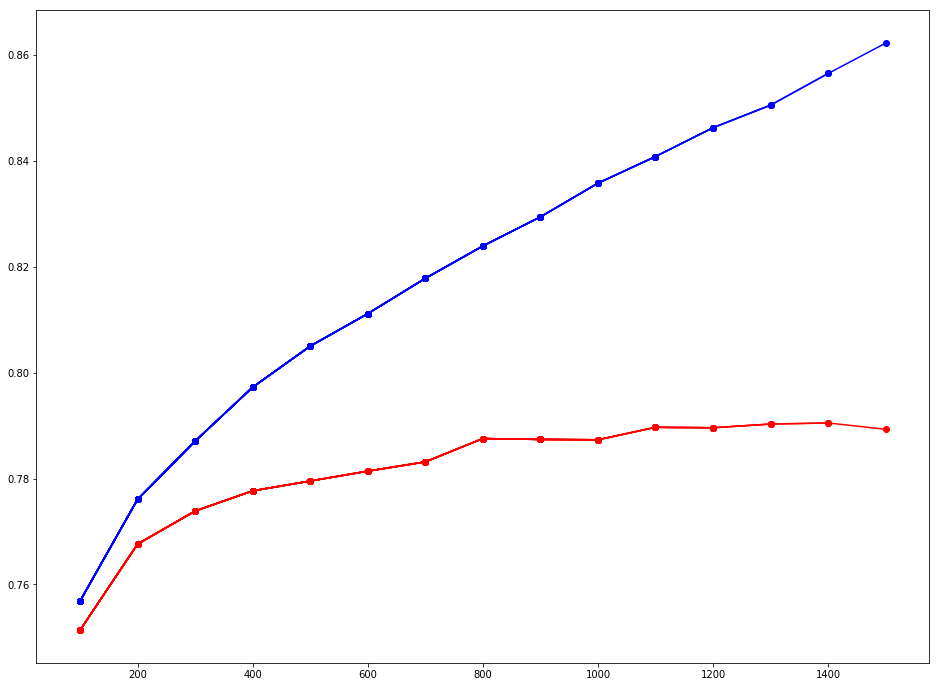

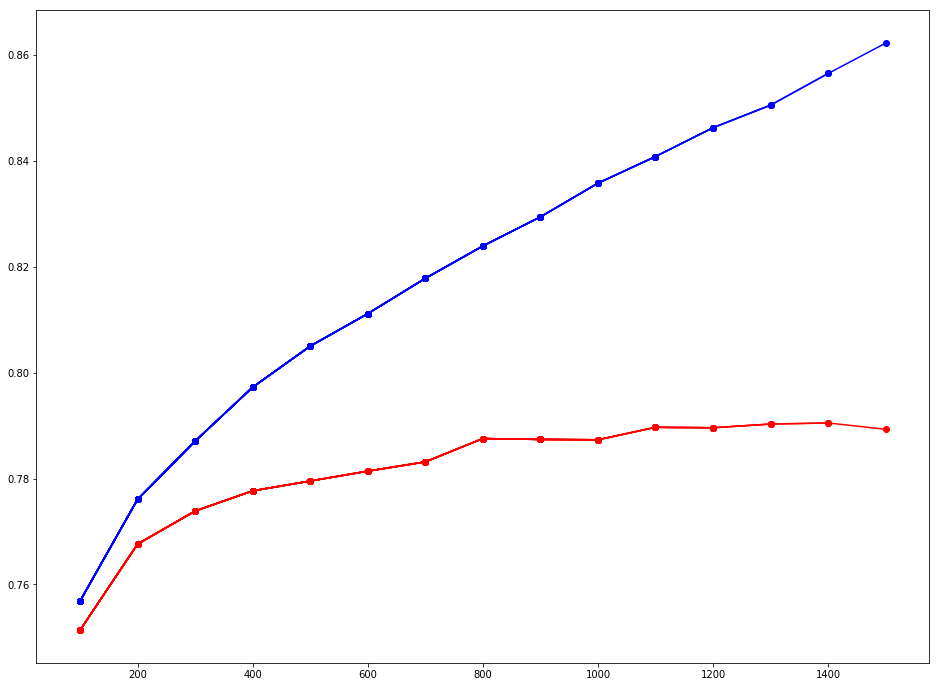

In [21]:
score_train = []
score_val = []
score_iter = []
iters = 100
iter_step = 100
while iters < 1501:
    model = catboost.CatBoostClassifier(loss_function='Logloss',
                                    #custom_loss=['MCC','BalancedAccuracy'],
                                    #leaf_estimation_method = 'Newton',
                                    l2_leaf_reg=20,
                                    border_count=200,
                                    #early_stopping_rounds=True, 
                                    #eval_metric='BalancedAccuracy',
                                    max_depth=5,
                                    bootstrap_type='No', 
                                    random_strength=0, 
                                    iterations=iters, 
                                    learning_rate=0.05, 
                                    verbose=False,
                                    thread_count=4, 
                                    task_type='GPU', 
                                    random_state=12,
                                    rsm=1,
)
    model.fit(train_concat.loc[:val_split_index],
          labels[:val_split_index+1],
          sample_weight=abs_weights[:val_split_index+1],
          #plot=True,
          save_snapshot=True,
          snapshot_file='snapshot22.file'
          #baseline=baseline,
          #cat_features=cat_features,
          #eval_set=(train_concat.loc[val_split_index:].values, labels[val_split_index:].values),
          #early_stopping_rounds=100,
          #use_best_model=True,
)
#check overfit train
    validation_predictions = model.predict_proba(train_concat.loc[:val_split_index].values)[:, 1]
    score = scoring.rejection90(labels[:val_split_index+1].values, validation_predictions, sample_weight=weights[:val_split_index+1].values)
    validation_predictions = model.predict_proba(train_concat.loc[val_split_index:].values)[:, 1]
    score2=scoring.rejection90(labels[val_split_index:].values, validation_predictions, sample_weight=weights[val_split_index:].values)
    score_train.append(score)
    score_val.append(score2)
    score_iter.append(iters)
    pl.plot(score_iter, score_train, "b",)
    pl.scatter(score_iter,score_train,c='b')
    pl.plot(score_iter, score_val, "r",)
    pl.scatter(score_iter,score_val,c='r')
    
    display.clear_output(wait=True)
    display.display(pl.gcf())
    
    #print(iters,score_train,score_val)
    iters += iter_step

In [62]:
with open('backup.pkl','rb') as fin:
    backup = pickle.load(fin)
    
index = len(backup)
backup[index]['train'] = score_train.copy()
backup[index]['val'] = score_val.copy()
backup[index]['iter'] = score_iter.copy()
backup[index]['title'] = 'GPU +0-7/dxy^2 -0-23'

with open('backup.pkl','wb') as fin:
    pickle.dump(backup,fin,pickle.HIGHEST_PROTOCOL)

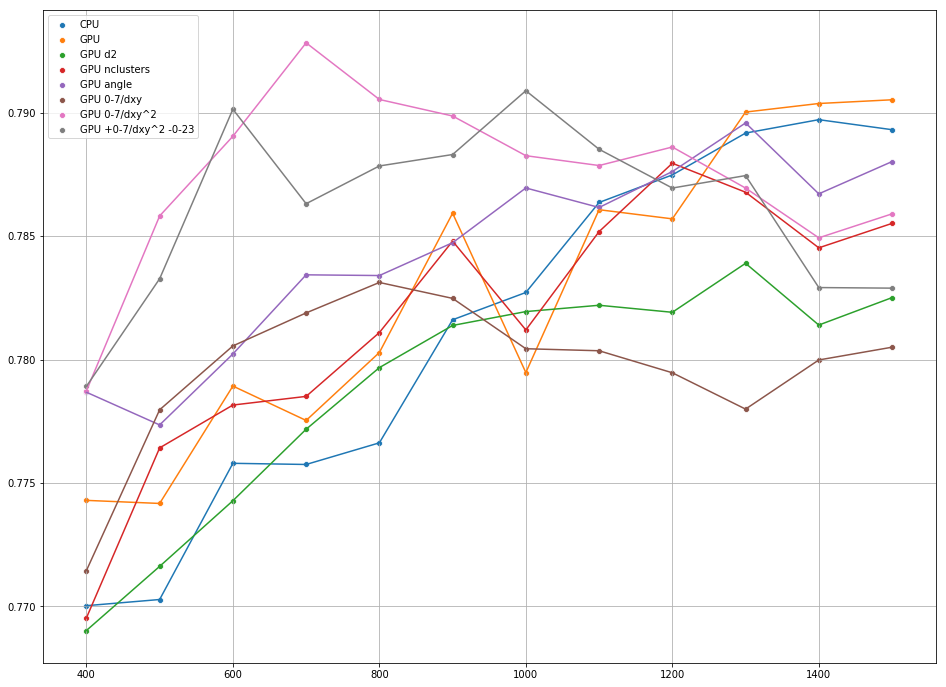

In [64]:
plt.grid(True)
for i in range(20,len(backup)):
    sns.scatterplot(backup[i]['iter'][3:],backup[i]['val'][3:],label=backup[i]['title'])
    pl.plot(backup[i]['iter'][3:],backup[i]['val'][3:])
plt.show()

In [28]:
score_val

[0.7404429737375208,
 0.7548437820165583,
 0.7622354565555655,
 0.7690266519116511,
 0.7716238014504508,
 0.7742823262236818,
 0.7771765116364403,
 0.7796715340027957,
 0.7813793752166384,
 0.7819408250570912,
 0.7821970479013476,
 0.7819121150567977,
 0.7838954168097975,
 0.7813962028363844,
 0.7825064750190082]

In [21]:
score_val

[0.7345559855757603,
 0.7606687585566094,
 0.7705462914263848,
 0.7742965463113246,
 0.7741719209585266,
 0.7789254462713043,
 0.7775326110543735,
 0.7802836451142646,
 0.785924035650718,
 0.7794716487739215,
 0.7860661891380621,
 0.7856956233706758,
 0.7900202614723072,
 0.7903667402628598,
 0.7905175264408487]

In [24]:
validation_predictions2 = model.predict_proba(train_concat.values)[:, 1]

In [25]:
train_concat['weight'] = weights
train_concat['label'] = labels
train_concat['pred'] = validation_predictions2

In [26]:
train_concat['diff'] = abs(train_concat['label'] - train_concat['pred'])

In [27]:
closest_hits_features.loc[[772660,2199526],:]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
772660,16.848860,35984.078125,9015.041016,4359.980957,77934.023438,1960.872314,19492.878906,8424.106445,5.0,12.0,6.0,10.0,15319.550781,16405.861328,17514.960938,18806.845703,3.208333,20.750,29.5,15.833333,126.278549,16.929256,36.479130,19.429239
2199526,67.598022,24.395786,6955.238281,51433.941406,2423.159912,2810.098389,25942.765625,519552.343750,8.0,2.0,9.0,6.0,15321.793945,16529.156250,17522.191406,18875.658203,6.375000,6.875,59.0,80.000000,31.479162,33.979145,73.078896,304.680542


In [28]:
train_concat.loc[[772660,2199526],:]

,ncl[0],ncl[1],ncl[2],ncl[3],avg_cs[0],avg_cs[1],avg_cs[2],avg_cs[3],ndof,MatchedHit_TYPE[0],MatchedHit_TYPE[1],MatchedHit_TYPE[2],MatchedHit_TYPE[3],MatchedHit_X[0],MatchedHit_X[1],MatchedHit_X[2],MatchedHit_X[3],MatchedHit_Y[0],MatchedHit_Y[1],MatchedHit_Y[2],MatchedHit_Y[3],MatchedHit_Z[0],MatchedHit_Z[1],MatchedHit_Z[2],MatchedHit_Z[3],MatchedHit_DX[0],MatchedHit_DX[1],MatchedHit_DX[2],MatchedHit_DX[3],MatchedHit_DY[0],MatchedHit_DY[1],MatchedHit_DY[2],MatchedHit_DY[3],MatchedHit_DZ[0],MatchedHit_DZ[1],MatchedHit_DZ[2],MatchedHit_DZ[3],MatchedHit_T[0],MatchedHit_T[1],MatchedHit_T[2],MatchedHit_T[3],MatchedHit_DT[0],MatchedHit_DT[1],MatchedHit_DT[2],MatchedHit_DT[3],Lextra_X[0],Lextra_X[1],Lextra_X[2],Lextra_X[3],Lextra_Y[0],Lextra_Y[1],Lextra_Y[2],Lextra_Y[3],NShared,Mextra_DX2[0],Mextra_DX2[1],Mextra_DX2[2],Mextra_DX2[3],Mextra_DY2[0],Mextra_DY2[1],Mextra_DY2[2],Mextra_DY2[3],FOI_hits_N,PT,P,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,weight,label,pred,diff
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
772660,122,43,19,50,3.401639,2.511628,1.789474,1.94,8,1,1,2,1,-539.671692,-396.049988,-730.869995,-588.403320,125.052376,-121.879822,-38.591953,-98.473221,15319.550781,16405.861328,17514.960938,18806.845703,3.208333,20.750,29.5,15.833333,126.278549,16.929256,36.479130,19.429239,33.954948,33.561180,33.631580,33.570183,5,12,6,11,5,12,2,11,-535.566956,-585.744690,-635.922424,-686.100159,-154.114273,-166.161560,-178.208847,-190.256149,0,11.927430,33.206989,72.469482,137.083176,11.907456,33.151382,72.348122,136.853607,5,1581.136277,64190.776095,16.848860,35984.078125,9015.041016,4359.980957,77934.023438,1960.872314,19492.878906,8424.106445,5.0,12.0,6.0,10.0,15319.550781,16405.861328,17514.960938,18806.845703,3.208333,20.750,29.5,15.833333,126.278549,16.929256,36.479130,19.429239,-0.718995,1,0.000016,0.999984
2199526,42,21,1,6,3.023809,1.809524,1.000000,1.00,8,2,2,2,1,1157.324951,1275.185059,1450.599976,1694.819946,220.334915,237.588516,359.114594,932.315674,15321.793945,16529.156250,17522.191406,18875.658203,6.375000,6.875,59.0,80.000000,31.479162,33.979145,73.078896,304.680542,33.613575,33.622578,33.763374,176.029510,8,7,9,6,1,-8,0,6,1165.546753,1266.374268,1367.201904,1468.029419,171.109314,184.578156,198.047012,211.515854,0,16.741394,48.151913,105.918137,200.523254,16.625000,47.817131,105.181725,199.129074,8,3399.414600,54865.922712,67.598022,24.395786,6955.238281,51433.941406,2423.159912,2810.098389,25942.765625,519552.343750,8.0,2.0,9.0,6.0,15321.793945,16529.156250,17522.191406,18875.658203,6.375000,6.875,59.0,80.000000,31.479162,33.979145,73.078896,304.680542,35.292664,0,0.000071,0.000071


In [29]:
train_concat.sort_values(by='diff',ascending=False)

,ncl[0],ncl[1],ncl[2],ncl[3],avg_cs[0],avg_cs[1],avg_cs[2],avg_cs[3],ndof,MatchedHit_TYPE[0],MatchedHit_TYPE[1],MatchedHit_TYPE[2],MatchedHit_TYPE[3],MatchedHit_X[0],MatchedHit_X[1],MatchedHit_X[2],MatchedHit_X[3],MatchedHit_Y[0],MatchedHit_Y[1],MatchedHit_Y[2],MatchedHit_Y[3],MatchedHit_Z[0],MatchedHit_Z[1],MatchedHit_Z[2],MatchedHit_Z[3],MatchedHit_DX[0],MatchedHit_DX[1],MatchedHit_DX[2],MatchedHit_DX[3],MatchedHit_DY[0],MatchedHit_DY[1],MatchedHit_DY[2],MatchedHit_DY[3],MatchedHit_DZ[0],MatchedHit_DZ[1],MatchedHit_DZ[2],MatchedHit_DZ[3],MatchedHit_T[0],MatchedHit_T[1],MatchedHit_T[2],MatchedHit_T[3],MatchedHit_DT[0],MatchedHit_DT[1],MatchedHit_DT[2],MatchedHit_DT[3],Lextra_X[0],Lextra_X[1],Lextra_X[2],Lextra_X[3],Lextra_Y[0],Lextra_Y[1],Lextra_Y[2],Lextra_Y[3],NShared,Mextra_DX2[0],Mextra_DX2[1],Mextra_DX2[2],Mextra_DX2[3],Mextra_DY2[0],Mextra_DY2[1],Mextra_DY2[2],Mextra_DY2[3],FOI_hits_N,PT,P,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,weight,label,pred,diff
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
772660,122,43,19,50,3.401639,2.511628,1.789474,1.940000,8,1,1,2,1,-539.671692,-396.049988,-730.869995,-588.403320,125.052376,-121.879822,-38.591953,-98.473221,15319.550781,16405.861328,17514.960938,18806.845703,3.208333,20.750000,29.500000,15.833333,126.278549,16.929256,36.479130,19.429239,33.954948,33.561180,33.631580,33.570183,5,12,6,11,5,12,2,11,-535.566956,-585.744690,-635.922424,-686.100159,-154.114273,-166.161560,-178.208847,-190.256149,0,11.927430,33.206989,72.469482,137.083176,11.907456,33.151382,72.348122,136.853607,5,1581.136277,64190.776095,1.684886e+01,3.598408e+04,9015.041016,4359.980957,77934.023438,1960.872314,19492.878906,8424.106445,5.0,12.0,6.0,10.0,15319.550781,16405.861328,17514.960938,18806.845703,3.208333,20.750000,29.500000,15.833333,126.278549,16.929256,36.479130,19.429239,-0.718995,1,1.587307e-05,9.999841e-01
4940984,164,39,16,14,4.317073,2.641026,1.437500,1.642857,8,2,1,2,1,79.341667,-89.099998,32.599998,56.320000,-428.760864,-579.326843,-617.079102,-569.425232,15319.456055,16404.212891,17518.677734,18928.750000,3.208333,82.500000,29.500000,15.833333,15.679264,33.979145,36.479130,19.429239,33.556679,33.622578,33.631580,33.570183,4,14,12,9,-3,14,1,9,96.303772,100.621025,104.938278,109.255531,-469.085480,-505.865448,-542.645447,-579.425415,0,1.849650,5.244108,11.437605,21.472643,1.851365,5.248971,11.448213,21.492556,11,5457.579454,167600.181388,1.704673e+01,3.599407e+04,5232.826660,2802.170410,1626.074585,5396.576660,5540.369141,100.003662,13.0,14.0,12.0,9.0,15319.456055,16404.212891,17518.677734,18928.750000,3.208333,82.500000,29.500000,15.833333,15.679264,33.979145,36.479130,19.429239,-0.748782,1,2.016487e-05,9.999798e-01
5292953,161,93,32,19,3.937888,3.709677,1.687500,1.263158,8,2,1,1,1,521.391663,903.809998,614.066650,530.219971,205.532532,302.889404,274.008850,213.867188,15405.741211,16412.390625,17806.886719,19015.570312,3.208333,82.500000,14.833333,15.833333,15.679264,33.979145,18.179249,19.429239,33.556679,33.622578,33.565681,33.570183,6,12,2,1,4,12,2,1,506.570557,540.434143,574.297729,608.161316,191.807236,206.846588,221.885941,236.925278,0,5.867609,16.959665,37.566730,71.396591,5.863944,16.949072,37.543266,71.351997,13,3942.797099,89633.280053,3.951200e+00,1.320420e+05,1581.567017,6074.853516,188.383743,9224.222656,2716.797607,531.675537,11.0,12.0,2.0,1.0,15405.741211,16412.390625,17806.886719,19015.570312,3.208333,82.500000,14.833333,15.833333,15.679264,33.979145,18.179249,19.429239,3.672076,1,2.486266e-05,9.999751e-01
3336853,114,26,16,16,4.508772,2.653846,1.500000,1.187500,8,2,1,1,1,390.975006,738.809998,516.566650,372.986664,-237.558304,-239.807068,-275.381317,-413.026276,15119.143555,16410.435547,17519.908203,18929.312500,3.208333,82.500000,14.833333,15.833333,15.679264,33.979145,18.179249,19.429239,33.556679,33.622578,33.565681,33.570183,2,12,11,4,-2,12,11,4,380.205902,408.229218,436.252502,464.275818,-255.990051,-276

In [19]:
indexes_good = np.argsort(abs_diff)

In [20]:
indexes_bad = indexes_good[::-1]

In [21]:
train_concat['diff'] = 0

In [22]:
train_concat.loc[2000000:,'diff'] = abs_diff

In [23]:
train_concat['pred'] = -1

In [24]:
train_concat.loc[2000000:,'pred'] = validation_predictions

In [25]:
train_concat['weights'] = weights
train_concat['labels'] = labels

In [29]:
columns = ['labels','diff','pred','weights']

In [39]:
full_train.loc[[2438535,2717258],:]

,ncl[0],ncl[1],ncl[2],ncl[3],avg_cs[0],avg_cs[1],avg_cs[2],avg_cs[3],ndof,MatchedHit_TYPE[0],MatchedHit_TYPE[1],MatchedHit_TYPE[2],MatchedHit_TYPE[3],MatchedHit_X[0],MatchedHit_X[1],MatchedHit_X[2],MatchedHit_X[3],MatchedHit_Y[0],MatchedHit_Y[1],MatchedHit_Y[2],MatchedHit_Y[3],MatchedHit_Z[0],MatchedHit_Z[1],MatchedHit_Z[2],MatchedHit_Z[3],MatchedHit_DX[0],MatchedHit_DX[1],MatchedHit_DX[2],MatchedHit_DX[3],MatchedHit_DY[0],MatchedHit_DY[1],MatchedHit_DY[2],MatchedHit_DY[3],MatchedHit_DZ[0],MatchedHit_DZ[1],MatchedHit_DZ[2],MatchedHit_DZ[3],MatchedHit_T[0],MatchedHit_T[1],MatchedHit_T[2],MatchedHit_T[3],MatchedHit_DT[0],MatchedHit_DT[1],MatchedHit_DT[2],MatchedHit_DT[3],Lextra_X[0],Lextra_X[1],Lextra_X[2],Lextra_X[3],Lextra_Y[0],Lextra_Y[1],Lextra_Y[2],Lextra_Y[3],NShared,Mextra_DX2[0],Mextra_DX2[1],Mextra_DX2[2],Mextra_DX2[3],Mextra_DY2[0],Mextra_DY2[1],Mextra_DY2[2],Mextra_DY2[3],FOI_hits_N,FOI_hits_X,FOI_hits_Y,FOI_hits_Z,FOI_hits_DX,FOI_hits_DY,FOI_hits_DZ,FOI_hits_T,FOI_hits_DT,FOI_hits_S,PT,P,sWeight,particle_type,label,kinWeight,weight
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2438535,155,56,22,26,4.258065,2.678571,1.727273,1.615385,8,2,1,1,1,448.725006,738.809998,575.900024,466.886658,-47.959538,-103.407951,-55.782726,57.468201,15119.826172,16410.927734,17520.697266,19015.007812,3.208333,82.5,14.833333,15.833333,15.679264,33.979145,18.179249,19.429239,33.556679,33.622578,33.565681,33.570183,11,13,5,8,7,13,5,8,430.050232,469.189178,508.328125,547.467041,-24.888363,-26.804211,-28.720058,-30.635906,0,5.697824,16.278023,35.690285,67.286583,5.691693,16.260508,35.651882,67.214188,14,[410.225 410.225 416.64166 416.64166 423.0...,[ -47.959538 -79.55933 -47.959538 -79.5593...,[15119.826 15119.713 15119.826 15119.713 15119...,[ 3.2083333 3.2083333 3.2083333 3.2083333 ...,[15.679264 15.679264 15.679264 15.679264 15.67...,[33.55668 33.55668 33.55668 33.55668 33.55...,[10 10 11 11 14 6 6 7 11 13 5 4 5 8],[ 7 7 8 8 10 2 2 0 7 13 5 4 5 8],[0 0 0 0 0 0 0 0 0 1 2 2 2 3],1849.155806,94635.057848,-3.179609,0,0,197.338095,-627.458046
2717258,155,56,22,26,4.258065,2.678571,1.727273,1.615385,8,2,1,1,1,448.725006,738.809998,575.900024,466.886658,-47.959538,-103.407951,-55.782726,57.468201,15119.826172,16410.927734,17520.697266,19015.007812,3.208333,82.5,14.833333,15.833333,15.679264,33.979145,18.179249,19.429239,33.556679,33.622578,33.565681,33.570183,11,13,5,8,7,13,5,8,430.050232,469.189178,508.328125,547.467041,-24.888363,-26.804211,-28.720058,-30.635906,0,5.697824,16.278023,35.690285,67.286583,5.691693,16.260508,35.651882,67.214188,14,[410.225 410.225 416.64166 416.64166 423.0...,[ -47.959538 -79.55933 -47.959538 -79.5593...,[15119.826 15119.713 15119.826 15119.713 15119...,[ 3.2083333 3.2083333 3.2083333 3.2083333 ...,[15.679264 15.679264 15.679264 15.679264 15.67...,[33.55668 33.55668 33.55668 33.55668 33.55...,[10 10 11 11 14 6 6 7 11 13 5 4 5 8],[ 7 7 8 8 10 2 2 0 7 13 5 4 5 8],[0 0 0 0 0 0 0 0 0 1 2 2 2 3],1849.155806,94635.057848,0.246633,0,0,200.281021,49.395945


In [38]:
train_concat.loc[[2438535,2717258],:]

,ncl[0],ncl[1],ncl[2],ncl[3],avg_cs[0],avg_cs[1],avg_cs[2],avg_cs[3],ndof,MatchedHit_TYPE[0],MatchedHit_TYPE[1],MatchedHit_TYPE[2],MatchedHit_TYPE[3],MatchedHit_X[0],MatchedHit_X[1],MatchedHit_X[2],MatchedHit_X[3],MatchedHit_Y[0],MatchedHit_Y[1],MatchedHit_Y[2],MatchedHit_Y[3],MatchedHit_Z[0],MatchedHit_Z[1],MatchedHit_Z[2],MatchedHit_Z[3],MatchedHit_DX[0],MatchedHit_DX[1],MatchedHit_DX[2],MatchedHit_DX[3],MatchedHit_DY[0],MatchedHit_DY[1],MatchedHit_DY[2],MatchedHit_DY[3],MatchedHit_DZ[0],MatchedHit_DZ[1],MatchedHit_DZ[2],MatchedHit_DZ[3],MatchedHit_T[0],MatchedHit_T[1],MatchedHit_T[2],MatchedHit_T[3],MatchedHit_DT[0],MatchedHit_DT[1],MatchedHit_DT[2],MatchedHit_DT[3],Lextra_X[0],Lextra_X[1],Lextra_X[2],Lextra_X[3],Lextra_Y[0],Lextra_Y[1],Lextra_Y[2],Lextra_Y[3],NShared,Mextra_DX2[0],Mextra_DX2[1],Mextra_DX2[2],Mextra_DX2[3],Mextra_DY2[0],Mextra_DY2[1],Mextra_DY2[2],Mextra_DY2[3],FOI_hits_N,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,diff,pred,weights,labels
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2438535,155,56,22,26,4.258065,2.678571,1.727273,1.615385,8,2,1,1,1,448.725006,738.809998,575.900024,466.886658,-47.959538,-103.407951,-55.782726,57.468201,15119.826172,16410.927734,17520.697266,19015.007812,3.208333,82.5,14.833333,15.833333,15.679264,33.979145,18.179249,19.429239,33.556679,33.622578,33.565681,33.570183,11,13,5,8,7,13,5,8,430.050232,469.189178,508.328125,547.467041,-24.888363,-26.804211,-28.720058,-30.635906,0,5.697824,16.278023,35.690285,67.286583,5.691693,16.260508,35.651882,67.214188,14,0.25,inf,4592.0,6480.0,532.5,5872.0,732.5,7768.0,6.0,13.0,5.0,8.0,15120.0,16416.0,17520.0,19008.0,3.208984,82.5,14.835938,15.835938,15.679688,33.96875,18.171875,19.421875,0.000009,0.000009,-627.458046,0
2717258,155,56,22,26,4.258065,2.678571,1.727273,1.615385,8,2,1,1,1,448.725006,738.809998,575.900024,466.886658,-47.959538,-103.407951,-55.782726,57.468201,15119.826172,16410.927734,17520.697266,19015.007812,3.208333,82.5,14.833333,15.833333,15.679264,33.979145,18.179249,19.429239,33.556679,33.622578,33.565681,33.570183,11,13,5,8,7,13,5,8,430.050232,469.189178,508.328125,547.467041,-24.888363,-26.804211,-28.720058,-30.635906,0,5.697824,16.278023,35.690285,67.286583,5.691693,16.260508,35.651882,67.214188,14,0.25,inf,4592.0,6480.0,532.5,5872.0,732.5,7768.0,6.0,13.0,5.0,8.0,15120.0,16416.0,17520.0,19008.0,3.208984,82.5,14.835938,15.835938,15.679688,33.96875,18.171875,19.421875,0.000009,0.000009,49.395945,0


In [ ]:
train_concat.drop_duplicates()

In [41]:
train_good = train_concat.loc[2000000+indexes_good,:].head(100)

In [42]:
train_bad = train_concat.loc[2000000+indexes_bad,:].head(100)

In [37]:
labels_val

array([1, 1, 1, ..., 1, 1, 1], dtype=int8)

In [38]:
validation_predictions

array([0.94363887, 0.95287634, 0.33870881, ..., 0.90163387, 0.90073589,
       0.88041962])

In [21]:
max(score_val)

0.7867928368000902

In [128]:
#check overfit train
validation_predictions = model.predict_proba(train_concat.loc[:val_split_index].values)[:, 1]
scoring.rejection90(labels[:val_split_index+1].values, validation_predictions, sample_weight=weights[:val_split_index+1].values)

0.8618596176289711

In [129]:
#validation metric accuracy
validation_predictions = model.predict_proba(train_concat.loc[val_split_index:].values)[:, 1]
scoring.rejection90(labels[val_split_index:].values, validation_predictions, sample_weight=weights[val_split_index:].values)

0.7677721975127187

In [9]:
model = catboost.CatBoostClassifier()

In [10]:
model.load_model('7599.cbm')

In [14]:
model.load_model('track_2_baseline/archives/ripped_evaluator3333/track_2_model.cbm')

In [15]:
model.get_params()

{'loss_function': 'Logloss',
 'rsm': 1,
 'random_strength': 0,
 'border_count': 200,
 'bootstrap_type': 'No',
 'verbose': 0,
 'iterations': 1600,
 'thread_count': 4,
 'logging_level': 'Silent',
 'l2_leaf_reg': 20,
 'task_type': 'GPU',
 'depth': 6,
 'learning_rate': 0.05,
 'random_seed': 12}

In [29]:
model.save_model('model_zeros.cbm')

In [66]:
rejection90(labels[val_split_index:].values, validation_predictions, sample_weight=weights[val_split_index:].values)

Threshold: 0.7 rejected_total: 175704


0.9203066041792868

#### reverse validation model

In [31]:
model.fit(train_concat.loc[val_split_index:], labels[val_split_index:], sample_weight=abs_weights[val_split_index:],plot=True, cat_features=cat_features)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [32]:
#for validation purpose
validation_predictions = model.predict_proba(train_concat.loc[:val_split_index-1].values)[:, 1]
scoring.rejection90(labels[:val_split_index].values, validation_predictions, sample_weight=weights[:val_split_index].values)

0.7764411427169786

#### feature importance

In [49]:
train_concat.head(3)

,ncl[0],ncl[1],ncl[2],ncl[3],avg_cs[0],avg_cs[1],avg_cs[2],avg_cs[3],ndof,MatchedHit_TYPE[0],MatchedHit_TYPE[1],MatchedHit_TYPE[2],MatchedHit_TYPE[3],MatchedHit_X[0],MatchedHit_X[1],MatchedHit_X[2],MatchedHit_X[3],MatchedHit_Y[0],MatchedHit_Y[1],MatchedHit_Y[2],MatchedHit_Y[3],MatchedHit_Z[0],MatchedHit_Z[1],MatchedHit_Z[2],MatchedHit_Z[3],MatchedHit_DX[0],MatchedHit_DX[1],MatchedHit_DX[2],MatchedHit_DX[3],MatchedHit_DY[0],MatchedHit_DY[1],MatchedHit_DY[2],MatchedHit_DY[3],MatchedHit_DZ[0],MatchedHit_DZ[1],MatchedHit_DZ[2],MatchedHit_DZ[3],MatchedHit_T[0],MatchedHit_T[1],MatchedHit_T[2],MatchedHit_T[3],MatchedHit_DT[0],MatchedHit_DT[1],MatchedHit_DT[2],MatchedHit_DT[3],Lextra_X[0],Lextra_X[1],Lextra_X[2],Lextra_X[3],Lextra_Y[0],Lextra_Y[1],Lextra_Y[2],Lextra_Y[3],NShared,Mextra_DX2[0],Mextra_DX2[1],Mextra_DX2[2],Mextra_DX2[3],Mextra_DY2[0],Mextra_DY2[1],Mextra_DY2[2],Mextra_DY2[3],FOI_hits_N,PT,P,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,alpha_diff,angle,size_clusters_0,size_clusters_1,size_clusters_2,size_clusters_3
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,47,31,13,15,2.00,1.580645,1.153846,1.133333,8,2,2,2,2,-2685.080078,-2954.300049,-3140.969971,-3609.169922,1373.348145,1481.262207,1590.397461,1701.067627,15123.044922,16327.632812,17520.826172,18729.324219,25.50,27.50,118.0,126.0,126.278549,136.278488,146.278412,156.278351,33.954948,33.990959,34.026966,34.062977,3,2,7,5,0,0,0,0,-2665.387939,-2917.874023,-3170.360107,-3422.846436,1394.170532,1503.675171,1613.179688,1722.684326,0,345.493927,986.100830,2201.950195,4295.085449,333.436310,951.685425,2125.099854,4145.181641,6,1764.925899,12646.817591,400.0,1296.00,900.0,35328.0,441.0,529.0,529.0,484.0,3.0,2.0,7.0,5.0,15120.0,16328.0,17520.0,18736.0,25.50,27.50,118.0,126.0,126.25000,136.2500,146.2500,156.2500,-0.189051,1.430784,94.000000,49.000001,15.000000,17.000000
1,92,19,11,26,2.75,2.789474,1.363636,1.230769,8,2,2,2,1,739.549988,852.510010,827.000000,758.719971,2387.722168,2575.974609,2764.196533,2952.103271,15212.597656,16420.576172,17614.853516,18824.429688,25.50,27.50,118.0,756.0,126.278549,136.278488,146.278412,156.278351,33.954948,33.990959,34.026966,34.062977,9,10,8,4,1,-1,0,4,765.309204,844.153198,922.997192,1001.841187,2420.164307,2610.679199,2801.193848,2991.708740,1,62.960335,181.760788,405.539215,777.429138,64.267189,185.533554,413.956909,793.566040,4,4511.281266,28556.630027,676.0,72.25,9216.0,59296.0,1024.0,1156.0,1444.0,1600.0,9.0,10.0,8.0,4.0,15216.0,16416.0,17616.0,18832.0,25.50,27.50,118.0,756.0,126.25000,136.2500,146.2500,156.2500,0.186199,1.412155,253.000000,53.000002,15.000000,32.000001
2,100,21,11,12,2.93,2.428571,1.181818,1.083333,8,2,2,2,2,-1595.130005,-1748.449951,-1933.969971,-2066.669922,-318.644745,-344.529694,-221.993256,-235.322327,15317.953125,16522.060547,17598.300781,18806.351562,12.75,13.75,59.0,63.0,63.078957,68.078926,73.078896,78.078857,33.727364,33.745369,33.763374,33.781380,10,3,3,5,0,0,0,0,-1590.582642,-1745.545898,-1900.509277,-2055.472656,-282.487946,-304.673065,-326.858185,-349.043304,0,161.833542,447.806335,996.013245,1931.484009,159.182327,440.469940,979.695190,1899.839233,9,1062.550086,17491.702634,16.0,4.00,1089.0,100.0,1314.0,1580.0,10976.0,12912.0,10.0,3.0,3.0,5.0,15320.0,16528.0,17600.0,18800.0,12.75,13.75,59.0,63.0,63.09375,68.0625,73.0625,78.0625,-1.061878,1.510013,293.000007,51.000001,12.999999,13.000000


In [38]:
a = dict()
for index, value in enumerate(model.feature_importances_):
    print(train_concat.columns[index], value)
    a[train_concat.columns[index]] = value

ncl[0] 0.7841470515217661
ncl[1] 1.0750125613457708
ncl[2] 1.836628742543331
ncl[3] 0.9435764224968809
avg_cs[0] 0.5142120615239085
avg_cs[1] 0.6866801058271752
avg_cs[2] 0.562429124422542
avg_cs[3] 0.5387849398421469
ndof 0.5706529842457793
MatchedHit_TYPE[0] 1.290298981858996
MatchedHit_TYPE[1] 2.8173193378175743
MatchedHit_TYPE[2] 0.3694208063288261
MatchedHit_TYPE[3] 0.4081476124813521
MatchedHit_X[0] 0.2248210087592213
MatchedHit_X[1] 0.21418856132915826
MatchedHit_X[2] 0.23918135886193714
MatchedHit_X[3] 0.28058630320352984
MatchedHit_Y[0] 0.44484443588132155
MatchedHit_Y[1] 0.43881984219238146
MatchedHit_Y[2] 0.3818953221775577
MatchedHit_Y[3] 0.47964650790784785
MatchedHit_Z[0] 0.3416325946988902
MatchedHit_Z[1] 0.23191643757904004
MatchedHit_Z[2] 0.11524602307176748
MatchedHit_Z[3] 0.17405281577554774
MatchedHit_DX[0] 0.008960719590759739
MatchedHit_DX[1] 0.08838180278520111
MatchedHit_DX[2] 0.05678716217123429
MatchedHit_DX[3] 0.4355816923493879
MatchedHit_DY[0] 0.01894385429

#### save model

In [37]:
model.save_model("7702_35k_plastina_arr_angle_fina_velocity.cbm")

In [13]:
model = catboost.CatBoostClassifier(loss_function='Logloss',
                                    #custom_loss=['MCC','BalancedAccuracy'],
                                    #leaf_estimation_method = 'Newton',
                                    l2_leaf_reg=20,
                                    border_count=200,
                                    #early_stopping_rounds=True, 
                                    #eval_metric='BalancedAccuracy',
                                    max_depth=5,
                                    #feature_border_type='MinEntropy',
                                    bootstrap_type='No', 
                                    random_strength=0, 
                                    iterations=3000, 
                                    learning_rate=0.05, 
                                    verbose=False,
                                    thread_count=4, 
                                    #task_type='GPU', 
                                    random_state=12,
                                    rsm=1,
)


In [14]:
model.load_model('7673_3k_plastina_arr_angle_fina.cbm')

## prediction submit

In [35]:
predictions = model.predict_proba(train_concat.values)[:, 1]

In [36]:
pd.DataFrame(data={"prediction": predictions}, index=full_train.index).to_csv(
    "sample_submission_1039.csv", index_label="id")

### look at data

(array([152790.,  48085.,  64409., 108029., 184992., 297420., 404958.,
        441259., 472456., 548455.]),
 array([1.77215503e-06, 9.99915322e-02, 1.99981292e-01, 2.99971052e-01,
        3.99960812e-01, 4.99950572e-01, 5.99940333e-01, 6.99930093e-01,
        7.99919853e-01, 8.99909613e-01, 9.99899373e-01]),
 <a list of 10 Patch objects>)

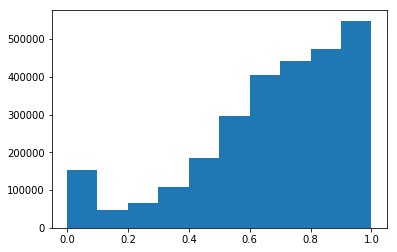

In [66]:
plt.hist(validation_predictions)

(array([ 50396.,  31101.,  54049.,  98373., 174231., 285162., 391713.,
        428392., 459624., 538997.]),
 array([1.23490739e-05, 1.00001051e-01, 1.99989754e-01, 2.99978456e-01,
        3.99967159e-01, 4.99955861e-01, 5.99944563e-01, 6.99933266e-01,
        7.99921968e-01, 8.99910670e-01, 9.99899373e-01]),
 <a list of 10 Patch objects>)

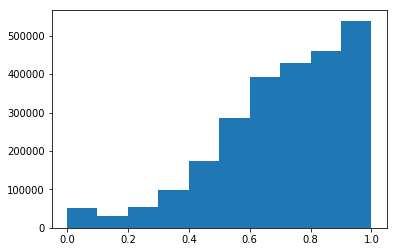

In [65]:
plt.hist(backup)

In [14]:
from collections import Counter

In [15]:
full_train.columns

Index(['ncl[0]', 'ncl[1]', 'ncl[2]', 'ncl[3]', 'avg_cs[0]', 'avg_cs[1]',
       'avg_cs[2]', 'avg_cs[3]', 'ndof', 'MatchedHit_TYPE[0]',
       'MatchedHit_TYPE[1]', 'MatchedHit_TYPE[2]', 'MatchedHit_TYPE[3]',
       'MatchedHit_X[0]', 'MatchedHit_X[1]', 'MatchedHit_X[2]',
       'MatchedHit_X[3]', 'MatchedHit_Y[0]', 'MatchedHit_Y[1]',
       'MatchedHit_Y[2]', 'MatchedHit_Y[3]', 'MatchedHit_Z[0]',
       'MatchedHit_Z[1]', 'MatchedHit_Z[2]', 'MatchedHit_Z[3]',
       'MatchedHit_DX[0]', 'MatchedHit_DX[1]', 'MatchedHit_DX[2]',
       'MatchedHit_DX[3]', 'MatchedHit_DY[0]', 'MatchedHit_DY[1]',
       'MatchedHit_DY[2]', 'MatchedHit_DY[3]', 'MatchedHit_DZ[0]',
       'MatchedHit_DZ[1]', 'MatchedHit_DZ[2]', 'MatchedHit_DZ[3]',
       'MatchedHit_T[0]', 'MatchedHit_T[1]', 'MatchedHit_T[2]',
       'MatchedHit_T[3]', 'MatchedHit_DT[0]', 'MatchedHit_DT[1]',
       'MatchedHit_DT[2]', 'MatchedHit_DT[3]', 'Lextra_X[0]', 'Lextra_X[1]',
       'Lextra_X[2]', 'Lextra_X[3]', 'Lextra_Y[0]', 'Lextra_

In [36]:
train = full_train[(full_train.label==1)&(full_train['MatchedHit_X[2]']!=-9999)][:100]

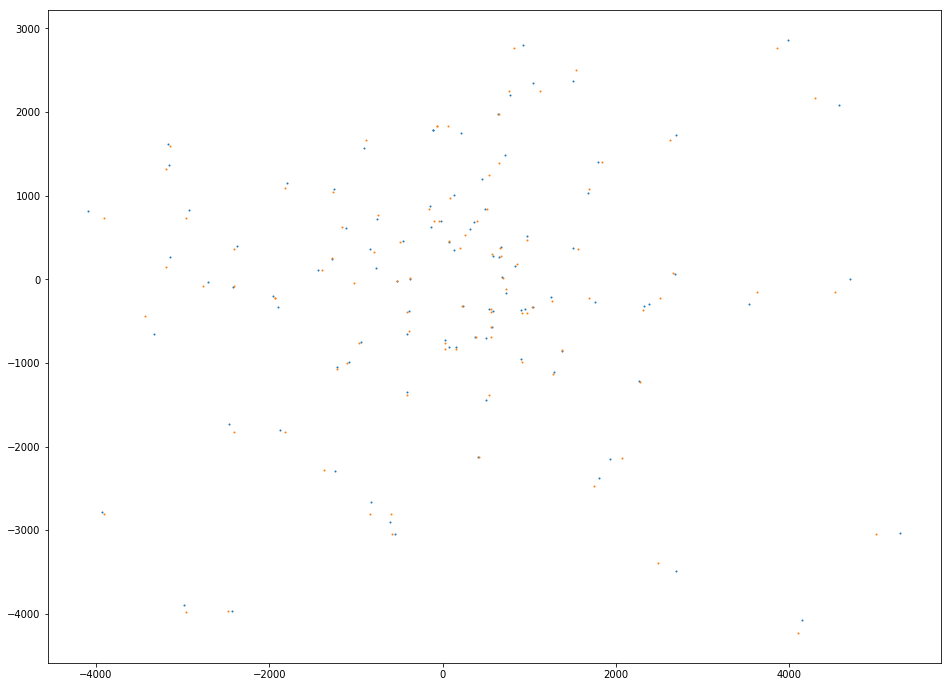

In [37]:
plt.scatter('Lextra_X[2]','Lextra_Y[2]',data=train,s=1)
plt.scatter('MatchedHit_X[2]','MatchedHit_Y[2]',data=train,s=1)
plt.show()

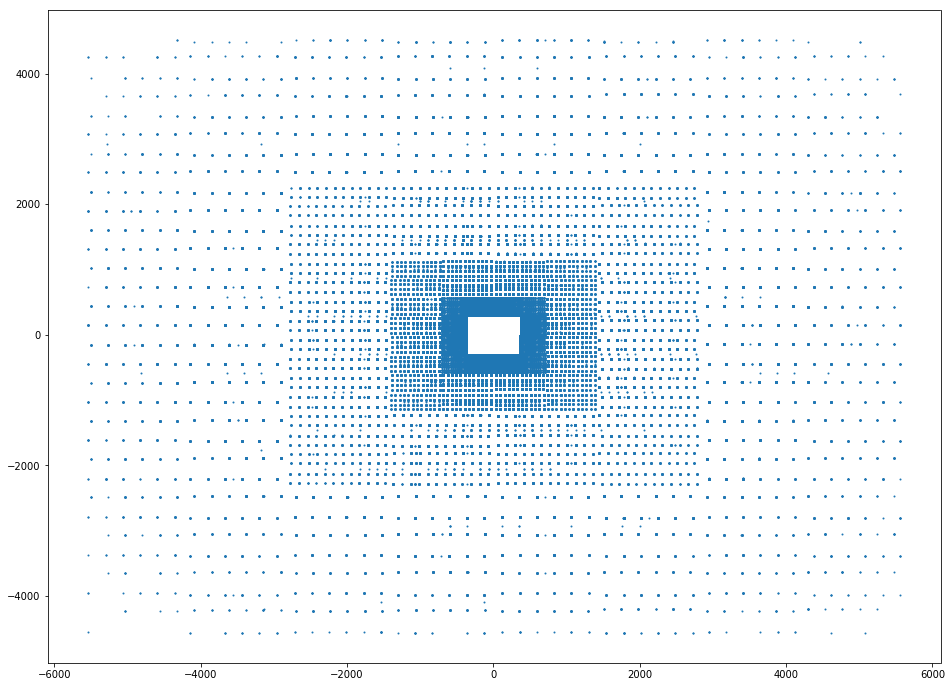

In [24]:
plt.scatter('MatchedHit_X[2]','MatchedHit_Y[2]',data=train,s=1)

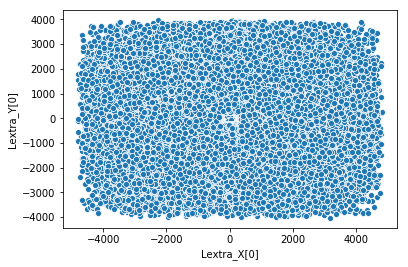

In [27]:
sns.scatterplot('Lextra_X[0]','Lextra_Y[0]',data=train,)

In [1]:
full_train2[((full_train2.weight>5)&(full_train2.weight<100))&(full_train2.label==0)]['weight'].hist(bins=70)

NameError: name 'full_train2' is not defined

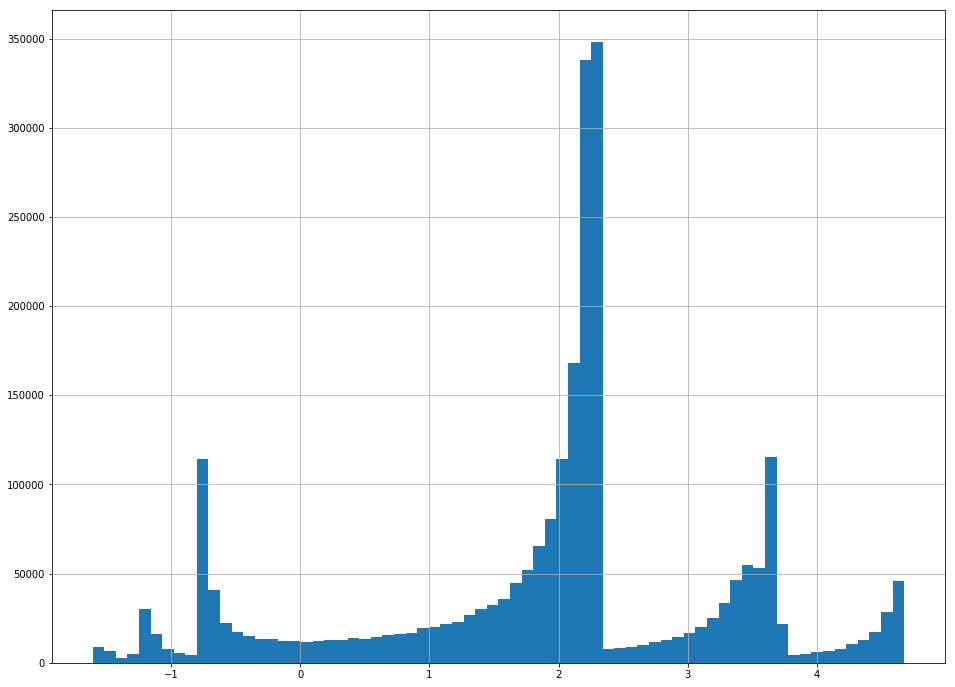

In [66]:
full_train[(full_train.weight<=5)&(full_train.weight>-2)&(full_train.label==1)]['weight'].hist(bins=70)

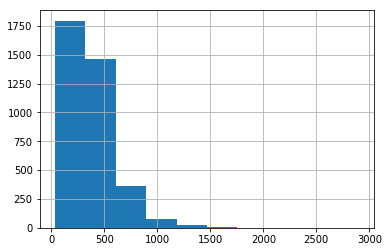

In [16]:
full_train[full_train.weight<-100]['kinWeight'].hist()

In [142]:
full_train.columns

Index(['ncl[0]', 'ncl[1]', 'ncl[2]', 'ncl[3]', 'avg_cs[0]', 'avg_cs[1]',
       'avg_cs[2]', 'avg_cs[3]', 'ndof', 'MatchedHit_TYPE[0]',
       'MatchedHit_TYPE[1]', 'MatchedHit_TYPE[2]', 'MatchedHit_TYPE[3]',
       'MatchedHit_X[0]', 'MatchedHit_X[1]', 'MatchedHit_X[2]',
       'MatchedHit_X[3]', 'MatchedHit_Y[0]', 'MatchedHit_Y[1]',
       'MatchedHit_Y[2]', 'MatchedHit_Y[3]', 'MatchedHit_Z[0]',
       'MatchedHit_Z[1]', 'MatchedHit_Z[2]', 'MatchedHit_Z[3]',
       'MatchedHit_DX[0]', 'MatchedHit_DX[1]', 'MatchedHit_DX[2]',
       'MatchedHit_DX[3]', 'MatchedHit_DY[0]', 'MatchedHit_DY[1]',
       'MatchedHit_DY[2]', 'MatchedHit_DY[3]', 'MatchedHit_DZ[0]',
       'MatchedHit_DZ[1]', 'MatchedHit_DZ[2]', 'MatchedHit_DZ[3]',
       'MatchedHit_T[0]', 'MatchedHit_T[1]', 'MatchedHit_T[2]',
       'MatchedHit_T[3]', 'MatchedHit_DT[0]', 'MatchedHit_DT[1]',
       'MatchedHit_DT[2]', 'MatchedHit_DT[3]', 'Lextra_X[0]', 'Lextra_X[1]',
       'Lextra_X[2]', 'Lextra_X[3]', 'Lextra_Y[0]', 'Lextra_

In [197]:
full_train[full_train['MatchedHit_TYPE[3]']<1]

,ncl[0],ncl[1],ncl[2],ncl[3],avg_cs[0],avg_cs[1],avg_cs[2],avg_cs[3],ndof,MatchedHit_TYPE[0],MatchedHit_TYPE[1],MatchedHit_TYPE[2],MatchedHit_TYPE[3],MatchedHit_X[0],MatchedHit_X[1],MatchedHit_X[2],MatchedHit_X[3],MatchedHit_Y[0],MatchedHit_Y[1],MatchedHit_Y[2],MatchedHit_Y[3],MatchedHit_Z[0],MatchedHit_Z[1],MatchedHit_Z[2],MatchedHit_Z[3],MatchedHit_DX[0],MatchedHit_DX[1],MatchedHit_DX[2],MatchedHit_DX[3],MatchedHit_DY[0],MatchedHit_DY[1],MatchedHit_DY[2],MatchedHit_DY[3],MatchedHit_DZ[0],MatchedHit_DZ[1],MatchedHit_DZ[2],MatchedHit_DZ[3],MatchedHit_T[0],MatchedHit_T[1],MatchedHit_T[2],MatchedHit_T[3],MatchedHit_DT[0],MatchedHit_DT[1],MatchedHit_DT[2],MatchedHit_DT[3],Lextra_X[0],Lextra_X[1],Lextra_X[2],Lextra_X[3],Lextra_Y[0],Lextra_Y[1],Lextra_Y[2],Lextra_Y[3],NShared,Mextra_DX2[0],Mextra_DX2[1],Mextra_DX2[2],Mextra_DX2[3],Mextra_DY2[0],Mextra_DY2[1],Mextra_DY2[2],Mextra_DY2[3],FOI_hits_N,FOI_hits_X,FOI_hits_Y,FOI_hits_Z,FOI_hits_DX,FOI_hits_DY,FOI_hits_DZ,FOI_hits_T,FOI_hits_DT,FOI_hits_S,PT,P,sWeight,particle_type,label,kinWeight,weight,size_clusters_0,size_clusters_1,size_clusters_2,size_clusters_3
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
23,67,9,6,10,2.179105,2.111111,1.333333,3.600000,4,2,2,0,0,132.250000,252.210007,-9999.000000,-9999.0,3166.915771,3414.667969,-9999.000000,-9999.0,15332.404297,16540.595703,-9999.000000,-9999.0,25.500000,27.500000,-9999.000000,-9999.0,126.278549,136.278488,-9999.000000,-9999.0,33.954948,33.990959,-9999.000000,-9999.0,9,11,-1,-1,-1,0,-1,-1,205.917892,362.745941,519.574036,676.402100,3125.349854,3357.512451,3589.675049,3821.837402,0,3982.685547,12374.510742,31266.968750,68037.632812,4059.841309,12614.224609,31872.636719,69355.546875,2,[132.25 252.21],[3166.9158 3414.668 ],[15332.404 16540.596],[25.5 27.5],[126.27855 136.27849],[33.95495 33.99096],[ 9 11],[-1 0],[0 1],1155.280439,3860.744752,0.853887,1,1,1.856460,1.585207,146.000006,19.000000,8.000000,35.999999
90,87,21,14,11,1.632184,1.761905,1.071429,1.363636,4,1,1,0,0,-88.055000,-12.958333,-9999.000000,-9999.0,-630.841431,-414.531738,-9999.000000,-9999.0,15199.828125,16605.808594,-9999.000000,-9999.0,6.375000,3.458333,-9999.000000,-9999.0,126.278549,136.278488,-9999.000000,-9999.0,33.954948,33.990959,-9999.000000,-9999.0,2,7,-1,-1,2,7,-1,-1,4.886008,-116.878716,-238.643433,-360.408142,-1433.528198,-1542.002075,-1650.475830,-1758.949707,0,3040.315430,9419.027344,23305.199219,49472.808594,3030.931152,9389.931641,23233.177734,49319.878906,5,[-88.055 139.86 304.86 359.86 -...,[ -630.84143 -2726.2417 -2726.2417 -2726.241...,[15199.828 16459.99 16459.99 16459.99 16605...,[ 6.375 29.85 29.85 29.85 ...,[126.27855 554.22644 554.22644 554.22644 136.2...,[33.95495 92.94758 92.94758 92.94758 33.99096],[ 2 3 14 8 7],[ 2 3 14 8 7],[0 1 1 1 1],923.183170,4294.052121,-0.403385,1,1,1.856460,-0.748868,142.000000,36.999999,15.000000,15.000000
125,58,17,29,20,2.568965,1.529412,1.172414,1.300000,4,2,2,0,0,-4709.180176,-5243.799805,-9999.000000,-9999.0,-1902.434448,-2052.418701,-9999.000000,-9999.0,15312.250000,16515.910156,-9999.000000,-9999.0,25.500000,27.500000,-9999.000000,-9999.0,126.278549,136.278488,-9999.000000,-9999.0,33.954948,33.990959,-9999.000000,-9999.0,6,4,-1,-1,0,0,-1,-1,-4586.087402,-5048.724609,-5511.361816,-5973.999023,-1901.882568,-2051.019043,-2200.155518,-2349.291992,0,2078.151123,5673.417969,13084.955078,26428.958984,1835.052612,5009.749023,11554.291992,23337.328125,4,[-4709.18 -4676.58 -4301.18 -5243.8 ],[-1902.4344 -1636.8348 -1902.4344 -2052.4187],[15312.25 15196.205 15312.25 16515.91 ],[25.5 25.5 25.5 27.5],[126.27855 126.27855 126.27855 136.27849],[33.95495 33.95495 33.95495 33.99096],[ 6 6 12 4],[ 0 -6 6 0],[0 0 0 1],1056.988965,5753.268305,1.177957,1,1,3.000000,3.533871,148.999995,26.000000,34.000001,25.999999
161,21,22,5,8,1.761905,2.454545,1.200000,1.125000,6,2,2,2,0,637.549988,742.510010,591.000000,-9999.0,-3145.441895,-3393.686523,-3641.961914,-9999.0,15192.672852,16399.078125,175

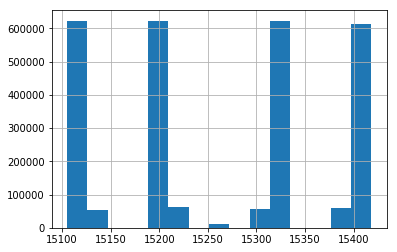

In [199]:
def wrapper(x):
    return x
    return np.log(x)
full_train['MatchedHit_Z[0]'].apply(wrapper).hist(bins=15)

In [149]:
full_train['MatchedHit_Z[0]']

id
0          15123.044922
1          15212.597656
2          15317.953125
3          15201.410156
4          15205.489258
5          15203.223633
6          15410.896484
7          15118.082031
8          15116.166992
9          15327.156250
10         15203.507812
11         15321.261719
12         15121.741211
13         15119.314453
14         15412.797852
15         15319.968750
16         15203.654297
17         15321.566406
18         15267.039062
19         15399.722656
20         15202.037109
21         15321.717773
22         15203.541016
23         15332.404297
24         15394.377930
25         15321.261719
26         15200.168945
27         15403.896484
28         15325.331055
29         15117.399414
30         15306.773438
31         15117.626953
32         15317.916016
33         15115.724609
34         15117.981445
35         15201.870117
36         15403.791992
37         15125.173828
38         15119.541992
39         15314.378906
40         15205.466797
41         15

inf

#### fixed 1000 into -9999 | 99999 as inf

In [32]:
columns = [str(i) for i in range(24)]

In [33]:
for column in columns:
    train_concat[column] = train_concat[column].apply(lambda x: 99999 if x ==np.inf else x)

In [37]:
for column in columns:
    train_concat[column] = train_concat[column].apply(lambda x: 9999 if x == 1000 else x)

#### predict weights

In [38]:
model = catboost.CatBoostRegressor(learning_rate=0.5, bootstrap_type='No', iterations=200, max_depth=6, thread_count=4, verbose=False, task_type='GPU', random_seed=0)

In [104]:
val_split_index

2722852

In [119]:
train_concat.loc[:2000000].shape

(2000001, 94)

In [120]:
len(train_concat, len(weights[:val_split_index+1])

(2722853, 2722853)

In [39]:
model.fit(train_concat, weights, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [45]:
validation_predictions = model.predict(train_concat.values)

In [123]:
from sklearn.metrics import mean_squared_error

In [28]:
per_min, per_max = np.percentile(weights,[1,99])

In [29]:
per_min, per_max

(-3.831022285897888, 46.38987887292503)

In [30]:
mask = (weights>per_min)&(weights<per_max)

In [31]:
train_concat = train_concat.loc[mask,:]

In [32]:
train_concat.index = range(train_concat.shape[0])

In [33]:
weights = weights[mask]

In [34]:
weights = list(weights)

In [35]:
train_concat.shape

(5336789, 94)

In [36]:
len(weights)

5336789

In [ ]:
#10 баллов гриффиндору за любопытство

In [124]:
mean_squared_error([0]*len(weights[val_split_index:]), weights[val_split_index:])

18.768884461090362

In [125]:
mean_squared_error(validation_predictions, weights[val_split_index:])

11.4444077889796

In [127]:
validation_predictions[:20], weights[val_split_index:][:20]

(array([1.80216479, 2.97675693, 2.13302169, 2.02227293, 1.71427621,
        1.84824229, 2.47684735, 2.33296631, 2.4425276 , 1.51247682,
        2.10281472, 2.16364124, 2.31968142, 2.46712659, 2.10889567,
        3.01095569, 1.76840565, 1.54138615, 1.87915287, 2.35448005]),
 [2.4454472301703425,
  2.1353175229368198,
  3.6305999890254683,
  2.1965105353080507,
  1.56802000452692,
  1.1953754294527543,
  2.256652606190843,
  3.3296491754457183,
  1.9795028423540109,
  3.1859365612235298,
  2.002569296063854,
  -0.6906244847600614,
  2.2572989995892074,
  2.2496932995629004,
  2.2079503623164403,
  4.4165564758648985,
  2.1863833020682883,
  4.488018185739937,
  0.7514074581596734,
  3.702935824804233])

In [85]:
ind_todrop=[2405082,249197, 1174610,249197, 999278, 1006092,1293584,1174610, 1317515, 1457094,588827, 1174610, 1317515]

In [86]:
train_concat.loc[ind_todrop,:]

,ncl[0],ncl[1],ncl[2],ncl[3],avg_cs[0],avg_cs[1],avg_cs[2],avg_cs[3],ndof,MatchedHit_TYPE[0],MatchedHit_TYPE[1],MatchedHit_TYPE[2],MatchedHit_TYPE[3],MatchedHit_X[0],MatchedHit_X[1],MatchedHit_X[2],MatchedHit_X[3],MatchedHit_Y[0],MatchedHit_Y[1],MatchedHit_Y[2],MatchedHit_Y[3],MatchedHit_Z[0],MatchedHit_Z[1],MatchedHit_Z[2],MatchedHit_Z[3],MatchedHit_DX[0],MatchedHit_DX[1],MatchedHit_DX[2],MatchedHit_DX[3],MatchedHit_DY[0],MatchedHit_DY[1],MatchedHit_DY[2],MatchedHit_DY[3],MatchedHit_DZ[0],MatchedHit_DZ[1],MatchedHit_DZ[2],MatchedHit_DZ[3],MatchedHit_T[0],MatchedHit_T[1],MatchedHit_T[2],MatchedHit_T[3],MatchedHit_DT[0],MatchedHit_DT[1],MatchedHit_DT[2],MatchedHit_DT[3],Lextra_X[0],Lextra_X[1],Lextra_X[2],Lextra_X[3],Lextra_Y[0],Lextra_Y[1],Lextra_Y[2],Lextra_Y[3],NShared,Mextra_DX2[0],Mextra_DX2[1],Mextra_DX2[2],Mextra_DX2[3],Mextra_DY2[0],Mextra_DY2[1],Mextra_DY2[2],Mextra_DY2[3],FOI_hits_N,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,diff,pred,weights,labels
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2405082,136,83,13,15,5.544117,5.759036,2.538461,1.866667,8,2,2,1,1,429.475006,463.285004,486.899994,521.619995,-142.758926,-154.155136,-165.582016,-138.224243,15119.485352,16326.744141,17520.302734,18729.300781,3.208333,3.458333,14.833333,15.833333,15.679264,16.929256,18.179249,19.429239,33.556679,33.561180,33.565681,33.570183,4,6,9,9,3,4,9,9,427.170135,460.915833,494.661560,528.407288,-131.884140,-142.200455,-152.516769,-162.833084,1,0.020412,0.057931,0.127084,0.240216,0.020397,0.057889,0.126993,0.240044,71,5.062500,5.0625,60.0625,49.000000,118.250000,141.000000,172.2500,606.500000,4.0,6.0,9.0,9.0,15120.0,16328.0,17520.0,18736.0,3.208984,3.458984,14.835938,15.835938,15.679688,16.921875,18.171875,19.421875,0.563645,0.563645,5.311064,0
249197,132,22,16,18,3.151515,2.500000,1.750000,1.500000,8,2,2,2,2,-1300.831177,-1445.949951,-1475.869995,-1576.670044,-192.686188,-344.529694,-369.293610,-392.422638,15201.405273,16522.060547,17714.769531,18922.787109,12.948485,13.750000,59.000000,63.000000,63.038589,68.078926,73.078896,78.078857,33.727219,33.745369,33.763374,33.781380,6,9,13,5,1,4,7,0,-1304.587891,-1407.984619,-1511.381226,-1614.777954,-246.223328,-265.587799,-284.952240,-304.316711,1,0.085442,0.243881,0.535550,1.010903,0.084834,0.242145,0.531739,1.003709,7,16.000000,1444.0000,1225.0000,1444.000000,2876.000000,6240.000000,7100.0000,7788.000000,6.0,9.0,13.0,5.0,15200.0,16528.0,17712.0,18928.0,12.945312,13.750000,59.000000,63.000000,63.031250,68.062500,73.062500,78.062500,0.000000,-1.000000,-1.077121,1
1174610,91,7,2,9,4.010989,2.000000,1.500000,1.000000,8,2,2,1,1,-239.288330,-259.058319,-288.003326,-308.503326,388.654480,418.419159,449.504883,443.025757,15119.499023,16323.805664,17516.716797,18724.794922,3.208333,3.458333,14.833333,15.833333,15.679264,16.929256,18.179249,19.429239,33.556679,33.561180,33.565681,33.570183,4,5,10,9,2,1,10,9,-242.238907,-261.211517,-280.184113,-299.156708,386.347931,416.791840,447.235748,477.679657,0,0.005834,0.016764,0.037197,0.070859,0.005836,0.016770,0.037211,0.070887,9,9.000000,5.0625,60.0625,85.562500,6.250000,3.062500,5.0625,1208.000000,4.0,5.0,10.0,9.0,15120.0,16320.0,17520.0,18720.0,3.208984,3.458984,14.835938,15.835938,15.679688,16.921875,18.171875,19.421875,0.000000,-1.000000,-17.644070,0
249197,132,22,16,18,3.151515,2.500000,1.750000,1.500000,8,2,2,2,2,-1300.831177,-1445.949951,-1475.869995,-1576.670044,-192.686188,-344.529694,-369.293610,-392.422638,15201.405273,16522.060547,17714.769531,18922.787109,12.948485,13.750000,59.000000,63.000000,63.038589,68.078926,73.078896,78.078857,33.727219,33.745369,33.763374,33.781380,6,9,13,5,1,4,7,0,-1304.587891,-1407.984619,-1511.381226,-1614.777954,-246.223328,-265.587799,-284.952240,-304.316711,1,0.085442,0.243881,0.535550,1.010903,0.084834,0.242145,0.531739,1.003709,7,16.000000,1444.0000,1225.0000,1444.000000,2876.000000,6240.000000,7100.0000,7788.000000,6.0,9.0,13.0,5.0,15200.0,16528

In [44]:
y_train = train_concat['weights']

In [45]:
train_concat.drop(columns='weights',inplace=True)

In [46]:
model = catboost.CatBoostClassifier(learning_rate=0.3, bootstrap_type='No', iterations=200, max_depth=5, thread_count=4, verbose=False, task_type='GPU', random_seed=0)

In [47]:
model.fit(train_concat, y_train, sample_weight=abs_weights,plot=True, cat_features=cat_features)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [54]:
validation_predictions = model.predict(train_concat.values)

In [59]:
sum(validation_predictions[validation_predictions!=1])

0.0

In [34]:
#for validation purpose
validation_predictions = model.predict_proba(train_concat.loc[val_split_index:].values)[:, 1]
scoring.rejection90(labels[val_split_index:].values, validation_predictions, sample_weight=weights[val_split_index:].values)

0.997600034800479

In [ ]:
b

In [70]:
train

,ncl[0],ncl[1],ncl[2],ncl[3],avg_cs[0],avg_cs[1],avg_cs[2],avg_cs[3],ndof,MatchedHit_TYPE[0],MatchedHit_TYPE[1],MatchedHit_TYPE[2],MatchedHit_TYPE[3],MatchedHit_X[0],MatchedHit_X[1],MatchedHit_X[2],MatchedHit_X[3],MatchedHit_Y[0],MatchedHit_Y[1],MatchedHit_Y[2],MatchedHit_Y[3],MatchedHit_Z[0],MatchedHit_Z[1],MatchedHit_Z[2],MatchedHit_Z[3],MatchedHit_DX[0],MatchedHit_DX[1],MatchedHit_DX[2],MatchedHit_DX[3],MatchedHit_DY[0],MatchedHit_DY[1],MatchedHit_DY[2],MatchedHit_DY[3],MatchedHit_DZ[0],MatchedHit_DZ[1],MatchedHit_DZ[2],MatchedHit_DZ[3],MatchedHit_T[0],MatchedHit_T[1],MatchedHit_T[2],MatchedHit_T[3],MatchedHit_DT[0],MatchedHit_DT[1],MatchedHit_DT[2],MatchedHit_DT[3],Lextra_X[0],Lextra_X[1],Lextra_X[2],Lextra_X[3],Lextra_Y[0],Lextra_Y[1],Lextra_Y[2],Lextra_Y[3],NShared,Mextra_DX2[0],Mextra_DX2[1],Mextra_DX2[2],Mextra_DX2[3],Mextra_DY2[0],Mextra_DY2[1],Mextra_DY2[2],Mextra_DY2[3],FOI_hits_N,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,diff,pred,weights,labels
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2376433,179,26,34,24,3.022346,1.769231,1.470588,1.291667,8,2,1,1,1,-81.671669,-154.750000,-23.803333,-216.303329,-272.947540,-329.282288,-462.595490,-335.575470,15402.118164,16606.115234,17798.435547,19006.992188,3.208333,20.750000,14.833333,15.833333,15.679264,16.929256,18.179249,19.429239,33.556679,33.561180,33.565681,33.570183,8,14,11,8,5,14,11,8,-67.326881,-80.903397,-94.479904,-108.056419,-316.098541,-341.032349,-365.966156,-390.899963,0,13.135392,37.312172,81.616814,153.588684,13.139274,37.323196,81.640930,153.634064,11,2.250000e+00,5.456000e+03,4.996000e+03,1.170400e+04,1.849000e+03,1.380000e+02,9.312000e+03,3.080000e+03,11.0,14.0,11.0,8.0,15400.0,16608.0,17792.0,19008.0,3.208984,20.750000,14.835938,15.835938,15.679688,16.921875,18.171875,19.421875,0.999960,0.000040,-0.034746,1
2410262,108,52,21,32,2.962963,2.923077,1.380952,1.500000,8,2,1,1,1,-491.255005,-603.549988,-490.670013,-525.070007,327.852386,386.716888,415.302612,406.223511,15203.280273,16407.691406,17600.595703,18808.662109,3.208333,20.750000,14.833333,15.833333,15.679264,16.929256,18.179249,19.429239,33.556679,33.561180,33.565681,33.570183,1,13,6,1,-9,13,6,1,-475.961304,-517.736267,-559.511292,-601.286255,298.041077,321.543152,345.045197,368.547272,0,3.268212,9.512832,21.054287,39.852921,3.265466,9.504840,21.036598,39.819435,8,6.250000e+00,7.396000e+03,4.728000e+03,5.852000e+03,8.850000e+02,4.256000e+03,4.936000e+03,2.250000e+00,5.0,13.0,6.0,4.0,15200.0,16400.0,17600.0,18816.0,3.208984,20.750000,14.835938,15.835938,15.679688,16.921875,18.171875,19.421875,0.999941,0.000059,2.181473,1
2351639,123,29,17,16,3.016260,2.241379,1.705882,3.750000,8,2,1,1,1,-340.755005,-437.549988,-464.503326,-401.803345,235.651657,352.617096,235.302475,253.023178,15319.949219,16407.570312,17716.947266,18925.111328,3.208333,20.750000,14.833333,15.833333,15.679264,16.929256,18.179249,19.429239,33.556679,33.561180,33.565681,33.570183,2,11,4,12,-2,11,4,12,-324.856415,-354.965240,-385.074066,-415.182892,274.379974,296.014771,317.649567,339.284393,0,3.645573,10.176985,22.170120,41.815823,3.644428,10.173787,22.163157,41.802685,9,1.056250e+01,6.808000e+03,6.320000e+03,1.822500e+02,1.511000e+03,3.192000e+03,6.808000e+03,7.440000e+03,7.0,11.0,4.0,12.0,15320.0,16400.0,17712.0,18928.0,3.208984,20.750000,14.835938,15.835938,15.679688,16.921875,18.171875,19.421875,0.999940,0.000060,2.265268,1
2241017,100,64,36,44,2.630000,4.062500,1.388889,1.795455,8,1,1,1,1,-424.171661,-901.700012,-464.503326,-620.070007,125.052376,-240.826569,-314.393982,-254.872208,15319.550781,16321.431641,17714.968750,18806.281250,3.208333,82.500000,14.833333,15.833333,126.278549,33.979145,18.179249,19.429239,33.954948,33.622578,33.565681,33.570183,14,12,7,9,14,12,7,9,-412.228516,-454.874084,-497.519684,-540.165283,-297.411224,-320.807068,-344.202942,-367.598816,0,20.016869,57.496986,126.462631,238.900894,19.998581,57.444454,126.347076,238.682602,6,1.440000e+0

In [71]:
train = train_bad

In [66]:
train = train[train.labels==0]

In [63]:
train = train[(train.labels==0)&(train['MatchedHit_X[2]']!=-9999)&(train['MatchedHit_X[3]']!=-9999)]

In [33]:
full_train.loc[index]['label']

id
55    1
56    1
57    1
90    1
Name: label, dtype: int8

In [75]:
full_train.loc[:,utils.SIMPLE_FEATURE_COLUMNS].shape

(2722852, 65)

In [ ]:
full_train.drop_duplicates

In [79]:
ind = full_train.loc[:,utils.SIMPLE_FEATURE_COLUMNS].drop_duplicates().index

In [80]:
dub_indexes = set(list(range(full_train.shape[0]))) - set(ind)

In [82]:
dub_indexes = list(dub_indexes)

In [84]:
full_train.loc[dub_indexes,:]

,ncl[0],ncl[1],ncl[2],ncl[3],avg_cs[0],avg_cs[1],avg_cs[2],avg_cs[3],ndof,MatchedHit_TYPE[0],MatchedHit_TYPE[1],MatchedHit_TYPE[2],MatchedHit_TYPE[3],MatchedHit_X[0],MatchedHit_X[1],MatchedHit_X[2],MatchedHit_X[3],MatchedHit_Y[0],MatchedHit_Y[1],MatchedHit_Y[2],MatchedHit_Y[3],MatchedHit_Z[0],MatchedHit_Z[1],MatchedHit_Z[2],MatchedHit_Z[3],MatchedHit_DX[0],MatchedHit_DX[1],MatchedHit_DX[2],MatchedHit_DX[3],MatchedHit_DY[0],MatchedHit_DY[1],MatchedHit_DY[2],MatchedHit_DY[3],MatchedHit_DZ[0],MatchedHit_DZ[1],MatchedHit_DZ[2],MatchedHit_DZ[3],MatchedHit_T[0],MatchedHit_T[1],MatchedHit_T[2],MatchedHit_T[3],MatchedHit_DT[0],MatchedHit_DT[1],MatchedHit_DT[2],MatchedHit_DT[3],Lextra_X[0],Lextra_X[1],Lextra_X[2],Lextra_X[3],Lextra_Y[0],Lextra_Y[1],Lextra_Y[2],Lextra_Y[3],NShared,Mextra_DX2[0],Mextra_DX2[1],Mextra_DX2[2],Mextra_DX2[3],Mextra_DY2[0],Mextra_DY2[1],Mextra_DY2[2],Mextra_DY2[3],FOI_hits_N,FOI_hits_X,FOI_hits_Y,FOI_hits_Z,FOI_hits_DX,FOI_hits_DY,FOI_hits_DZ,FOI_hits_T,FOI_hits_DT,FOI_hits_S,PT,P,sWeight,particle_type,label,kinWeight,weight
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2605059,75,16,7,7,5.080000,2.250000,1.000000,1.428571,8,2,2,2,2,-3149.679932,-3505.899902,-3905.570068,-4169.770020,2164.736572,2332.150391,2500.885254,2671.054932,15410.896484,16615.699219,17809.107422,19017.820312,25.500000,27.500000,118.000000,126.000000,126.278549,136.278488,146.278412,156.278351,33.954948,33.990959,34.026966,34.062977,4,8,7,8,0,1,0,1,-3136.709717,-3460.605957,-3784.501953,-4108.397949,2232.739258,2407.114990,2581.490723,2755.866455,0,1179.152344,3479.548096,8187.387207,16695.589844,1121.546509,3309.558350,7787.398926,15879.937500,5,[-3200.68 -3149.68 -3505.9 -3905.57 -4169.77],[2164.7366 2164.7366 2332.1504 2500.8853 2671....,[15410.896 15410.896 16615.7 17809.107 19017...,[ 25.5 25.5 27.5 118. 126. ],[126.27855 126.27855 136.27849 146.27841 156.2...,[33.95495 33.95495 33.99096 34.026966 34.06...,[9 4 8 7 8],[5 0 1 0 1],[0 0 1 2 3],1211.092026,7251.065268,-0.426624,0,0,8.256397,-3.522376
1228804,81,6,9,10,2.592592,1.000000,1.111111,1.100000,8,2,2,2,2,1099.425049,1185.685059,1265.599976,1353.219971,-95.761711,-103.407951,-111.084854,-119.076851,15203.654297,16410.927734,17604.500000,18813.371094,6.375000,6.875000,29.500000,31.500000,31.479162,33.979145,36.479130,38.979115,33.613575,33.622578,33.631580,33.640583,8,2,8,3,5,0,0,-8,1095.789307,1190.288940,1284.788452,1379.287964,-110.004478,-118.600479,-127.196472,-135.792465,0,13.358022,38.037239,83.916199,159.484421,13.275608,37.802559,83.398453,158.500427,8,[1086.675 1086.675 1099.425 1099.425 1185.685 ...,[ -95.76171 -32.562122 -95.76171 -32.5621...,[15203.654 15203.882 15203.654 15203.882 16410...,[ 6.375 6.375 6.375 6.375 6.875 29.5 31....,[31.479162 31.479162 31.479162 31.479162 33.97...,[33.613575 33.613575 33.613575 33.613575 33.62...,[2 2 8 8 2 8 3 3],[-1 -7 5 -1 0 0 0 -8],[0 0 0 0 1 2 3 3],3552.276250,60856.274433,0.809687,0,0,12.775086,10.343823
2277383,75,65,10,15,2.493333,2.523077,1.600000,1.266667,8,2,2,1,1,-149.455002,-176.058334,-199.003326,-213.503326,388.654480,384.319366,449.504883,482.125488,15119.499023,16323.682617,17516.716797,18724.935547,3.208333,3.458333,14.833333,15.833333,15.679264,16.929256,18.179249,19.429239,33.556679,33.561180,33.565681,33.570183,4,1,10,6,2,-9,10,6,-142.755051,-162.482040,-182.209015,-201.935989,387.768524,418.258453,448.748383,479.238312,0,12.558915,36.844513,81.960670,155.740555,12.563475,36.857887,81.990425,155.797089,14,[-162.28833 -155.87167 -149.455 -143.03833 -...,[388.65448 388.65448 388.65448 388.65448 388.6...,[15119.499 15119.499 15119.499 15119.499 15119...,[ 3.2083333 3.2083333 3.2083333 3.2083333 ...,[15.679264 15.679264 15.679264 15.679264 15.67...,[33.55668 33.55668 33.55668 33.55668 33.55...,[13 3 4 5 7 7 7 3 3 1 1 2 10 6],[ 6 1 2 3 5 6 -3 2 -7 -9 0 2 10 6],[0 0 0 0 0 1 1 1 1 1 1 1 2 3],1590.777482,61981.637256,0.401430,0,0,213.655951,85.767915
1818633,76,24,8,24,1.960526,3.70

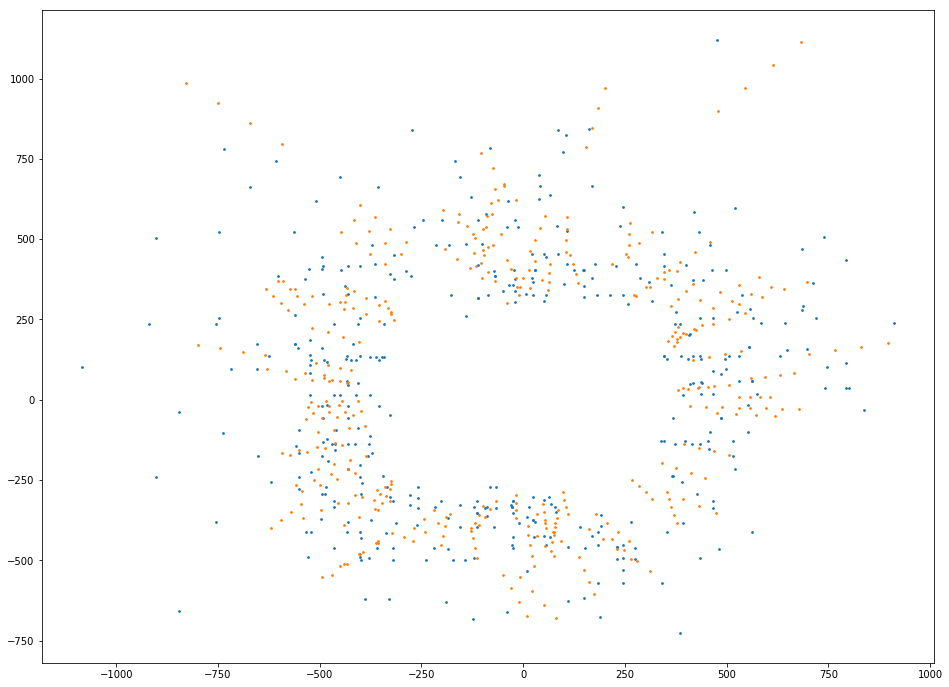

In [72]:
x = []
y = []
for i in range(4):
    x.append(train[f'MatchedHit_X[{i}]'])
    y.append(train[f'MatchedHit_Y[{i}]'])
plt.scatter(x,y,s=3)
x = []
y = []
for i in range(4):
    x.append(train[f'Lextra_X[{i}]'])
    y.append(train[f'Lextra_Y[{i}]'])
plt.scatter(x,y,s=3)
plt.show()

In [21]:
full_train[full_train['MatchedHit_X[3]']==-9999]

,ncl[0],ncl[1],ncl[2],ncl[3],avg_cs[0],avg_cs[1],avg_cs[2],avg_cs[3],ndof,MatchedHit_TYPE[0],MatchedHit_TYPE[1],MatchedHit_TYPE[2],MatchedHit_TYPE[3],MatchedHit_X[0],MatchedHit_X[1],MatchedHit_X[2],MatchedHit_X[3],MatchedHit_Y[0],MatchedHit_Y[1],MatchedHit_Y[2],MatchedHit_Y[3],MatchedHit_Z[0],MatchedHit_Z[1],MatchedHit_Z[2],MatchedHit_Z[3],MatchedHit_DX[0],MatchedHit_DX[1],MatchedHit_DX[2],MatchedHit_DX[3],MatchedHit_DY[0],MatchedHit_DY[1],MatchedHit_DY[2],MatchedHit_DY[3],MatchedHit_DZ[0],MatchedHit_DZ[1],MatchedHit_DZ[2],MatchedHit_DZ[3],MatchedHit_T[0],MatchedHit_T[1],MatchedHit_T[2],MatchedHit_T[3],MatchedHit_DT[0],MatchedHit_DT[1],MatchedHit_DT[2],MatchedHit_DT[3],Lextra_X[0],Lextra_X[1],Lextra_X[2],Lextra_X[3],Lextra_Y[0],Lextra_Y[1],Lextra_Y[2],Lextra_Y[3],NShared,Mextra_DX2[0],Mextra_DX2[1],Mextra_DX2[2],Mextra_DX2[3],Mextra_DY2[0],Mextra_DY2[1],Mextra_DY2[2],Mextra_DY2[3],FOI_hits_N,FOI_hits_X,FOI_hits_Y,FOI_hits_Z,FOI_hits_DX,FOI_hits_DY,FOI_hits_DZ,FOI_hits_T,FOI_hits_DT,FOI_hits_S,PT,P,sWeight,particle_type,label,kinWeight,weight,m_0_xy
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
23,67,9,6,10,2.179105,2.111111,1.333333,3.600000,4,2,2,0,0,132.250000,252.210007,-9999.000000,-9999.0,3166.915771,3414.667969,-9999.000000,-9999.0,15332.404297,16540.595703,-9999.000000,-9999.0,25.500000,27.500000,-9999.000000,-9999.0,126.278549,136.278488,-9999.000000,-9999.0,33.954948,33.990959,-9999.000000,-9999.0,9,11,-1,-1,-1,0,-1,-1,205.917892,362.745941,519.574036,676.402100,3125.349854,3357.512451,3589.675049,3821.837402,0,3982.685547,12374.510742,31266.968750,68037.632812,4059.841309,12614.224609,31872.636719,69355.546875,2,[132.25 252.21],[3166.9158 3414.668 ],[15332.404 16540.596],[25.5 27.5],[126.27855 136.27849],[33.95495 33.99096],[ 9 11],[-1 0],[0 1],1155.280439,3860.744752,0.853887,1,1,1.856460,1.585207,132.25 3166.9158
90,87,21,14,11,1.632184,1.761905,1.071429,1.363636,4,1,1,0,0,-88.055000,-12.958333,-9999.000000,-9999.0,-630.841431,-414.531738,-9999.000000,-9999.0,15199.828125,16605.808594,-9999.000000,-9999.0,6.375000,3.458333,-9999.000000,-9999.0,126.278549,136.278488,-9999.000000,-9999.0,33.954948,33.990959,-9999.000000,-9999.0,2,7,-1,-1,2,7,-1,-1,4.886008,-116.878716,-238.643433,-360.408142,-1433.528198,-1542.002075,-1650.475830,-1758.949707,0,3040.315430,9419.027344,23305.199219,49472.808594,3030.931152,9389.931641,23233.177734,49319.878906,5,[-88.055 139.86 304.86 359.86 -...,[ -630.84143 -2726.2417 -2726.2417 -2726.241...,[15199.828 16459.99 16459.99 16459.99 16605...,[ 6.375 29.85 29.85 29.85 ...,[126.27855 554.22644 554.22644 554.22644 136.2...,[33.95495 92.94758 92.94758 92.94758 33.99096],[ 2 3 14 8 7],[ 2 3 14 8 7],[0 1 1 1 1],923.183170,4294.052121,-0.403385,1,1,1.856460,-0.748868,-88.055 -630.84143
125,58,17,29,20,2.568965,1.529412,1.172414,1.300000,4,2,2,0,0,-4709.180176,-5243.799805,-9999.000000,-9999.0,-1902.434448,-2052.418701,-9999.000000,-9999.0,15312.250000,16515.910156,-9999.000000,-9999.0,25.500000,27.500000,-9999.000000,-9999.0,126.278549,136.278488,-9999.000000,-9999.0,33.954948,33.990959,-9999.000000,-9999.0,6,4,-1,-1,0,0,-1,-1,-4586.087402,-5048.724609,-5511.361816,-5973.999023,-1901.882568,-2051.019043,-2200.155518,-2349.291992,0,2078.151123,5673.417969,13084.955078,26428.958984,1835.052612,5009.749023,11554.291992,23337.328125,4,[-4709.18 -4676.58 -4301.18 -5243.8 ],[-1902.4344 -1636.8348 -1902.4344 -2052.4187],[15312.25 15196.205 15312.25 16515.91 ],[25.5 25.5 25.5 27.5],[126.27855 126.27855 126.27855 136.27849],[33.95495 33.95495 33.95495 33.99096],[ 6 6 12 4],[ 0 -6 6 0],[0 0 0 1],1056.988965,5753.268305,1.177957,1,1,3.000000,3.533871,-4709.18 -1902.4344
161,21,22,5,8,1.761905,2.454545,1.200000,1.125000,6,2,2,2,0,637.549988,742.510010,591.000000,-9999.0,-3145.441895,-3393.686523,-3641.961914,-9999.0,15192.672852,16399.078125,17591.785156,-9999.0,25.500000,27.500000,118.000000,-9999.0,126.278549,136.278488,146.278412,-9999.0,33.954948,33.990959,34.02696

In [15]:
import itertools as it
full_train['m_0_xy']=full_train['MatchedHit_X[0]'].astype(str)+' '+full_train["MatchedHit_Y[0]"].astype(str)
station_0=list(full_train['m_0_xy'].unique())
iter_station=iter(station_0)
n=len(station_0)
x=[]
y=[]
stop_ind=0
while stop_ind<n:
    stop_ind+=1
    coor=iter_station.__next__()
    x.append(np.float(coor.split(' ')[0]))
    y.append(np.float(coor.split(' ')[1]))

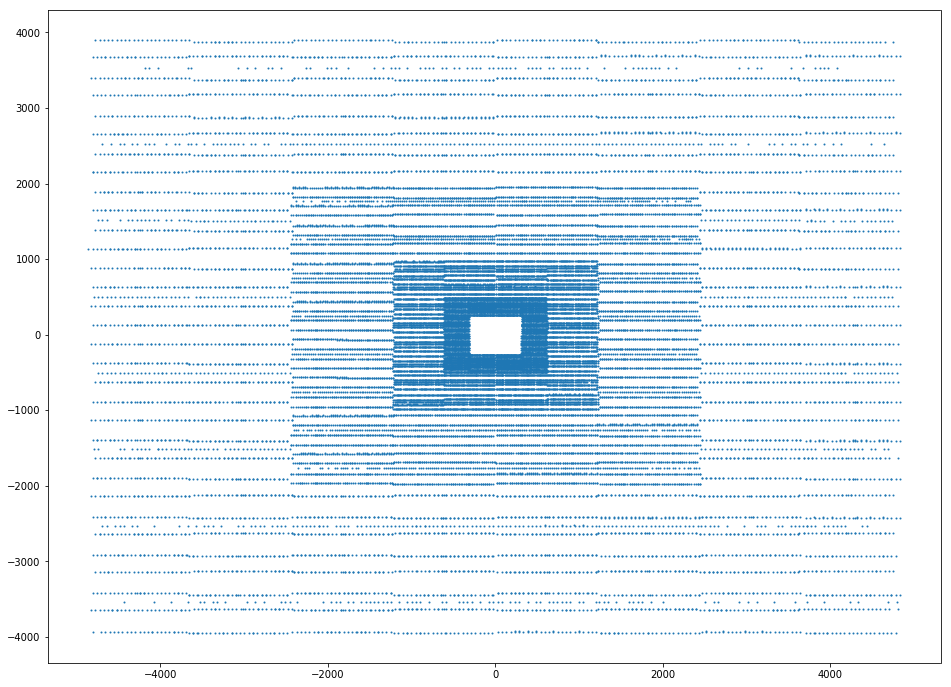

In [16]:
plt.scatter(x,y, s=1)

In [ ]:
plt.scatter('Lextra_X[2]','Lextra_Y[2]',data=train,s=1)
plt.scatter('MatchedHit_X[2]','MatchedHit_Y[2]',data=train,s=1)
plt.show()